In [53]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
import cv2


In [54]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import TensorBoard,EarlyStopping

import sklearn.metrics as metrics
from keras.callbacks import LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
annealer = LearningRateScheduler(lambda x: 1e-3 * 0.95 ** x, verbose=0)

In [55]:
import os

In [56]:
base_dir = '/raid/bsmse6/AugmentedAlzheimerDataset'

MildDemented_dir = '/raid/bsmse6/AugmentedAlzheimerDataset/MildDemented'
ModerateDemented_dir = '/raid/bsmse6/AugmentedAlzheimerDataset/ModerateDemented'
NonDemented_dir = '/raid/bsmse6/AugmentedAlzheimerDataset/NonDemented'
VeryMildDemented_dir = '/raid/bsmse6/AugmentedAlzheimerDataset/VeryMildDemented'

filepaths = []
labels = []
dict_list = [MildDemented_dir, ModerateDemented_dir, NonDemented_dir, VeryMildDemented_dir]
class_labels = ['Mild Demented', 'Moderate Demented', 'Non Demented', 'Very MildDemented']

for i, j in enumerate(dict_list):
    flist = os.listdir(j)
    for f in flist:
        fpath = os.path.join(j, f)
        filepaths.append(fpath)
        labels.append(class_labels[i])

Fseries = pd.Series(filepaths, name="filepaths")
Lseries = pd.Series(labels, name="labels")
Alzheimer_data = pd.concat([Fseries, Lseries], axis=1)
Alzheimer_df = pd.DataFrame(Alzheimer_data)
print(Alzheimer_df.head())
print(Alzheimer_df["labels"].value_counts())

                                           filepaths         labels
0  /raid/bsmse6/AugmentedAlzheimerDataset/MildDem...  Mild Demented
1  /raid/bsmse6/AugmentedAlzheimerDataset/MildDem...  Mild Demented
2  /raid/bsmse6/AugmentedAlzheimerDataset/MildDem...  Mild Demented
3  /raid/bsmse6/AugmentedAlzheimerDataset/MildDem...  Mild Demented
4  /raid/bsmse6/AugmentedAlzheimerDataset/MildDem...  Mild Demented
labels
Non Demented         9600
Mild Demented        8960
Very MildDemented    8960
Moderate Demented    6464
Name: count, dtype: int64


In [57]:
# ============================================================================
# COMPLETE ALZHEIMER'S DETECTION SYSTEM - ALL COMPONENTS
# Ready to run in your Jupyter notebook!
# ============================================================================


print("="*80)
print("ALZHEIMER'S DETECTION - COMPLETE SYSTEM WITH ALL COMPONENTS")
print("="*80)

ALZHEIMER'S DETECTION - COMPLETE SYSTEM WITH ALL COMPONENTS


In [58]:

# ============================================================================
# 1. SPATIAL ATTENTION 2D
# ============================================================================
class SpatialAttention2D(nn.Module):
    """2D Spatial Attention Module"""
    def __init__(self, kernel_size=7):
        super(SpatialAttention2D, self).__init__()
        self.conv = nn.Conv2d(2, 1, kernel_size, padding=kernel_size//2, bias=False)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x_concat = torch.cat([avg_out, max_out], dim=1)
        attention = self.sigmoid(self.conv(x_concat))
        return x * attention

print("✓ SpatialAttention2D defined")


✓ SpatialAttention2D defined


In [59]:


# ============================================================================
# 2. CHANNEL ATTENTION 2D
# ============================================================================
class ChannelAttention2D(nn.Module):
    """2D Channel Attention Module (SE-Block for 2D)"""
    def __init__(self, channels, reduction=16):
        super(ChannelAttention2D, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channels, channels // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channels // reduction, channels, bias=False)
        )
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        b, c, _, _ = x.size()
        avg_out = self.fc(self.avg_pool(x).view(b, c))
        max_out = self.fc(self.max_pool(x).view(b, c))
        attention = self.sigmoid(avg_out + max_out).view(b, c, 1, 1)
        return x * attention.expand_as(x)

print("✓ ChannelAttention2D defined")


✓ ChannelAttention2D defined


In [60]:

# ============================================================================
# 3. CBAM 2D
# ============================================================================
class CBAM2D(nn.Module):
    """Convolutional Block Attention Module for 2D"""
    def __init__(self, channels, reduction=16, kernel_size=7):
        super(CBAM2D, self).__init__()
        self.channel_attention = ChannelAttention2D(channels, reduction)
        self.spatial_attention = SpatialAttention2D(kernel_size)
    
    def forward(self, x):
        x = self.channel_attention(x)
        x = self.spatial_attention(x)
        return x

print("✓ CBAM2D defined")

✓ CBAM2D defined


In [61]:

# ============================================================================
# 4. ENHANCED CONV LAYER 2D
# ============================================================================
class EnhancedConvLayer2D(nn.Module):
    """Enhanced Convolutional Layer with Attention for 2D"""
    def __init__(self, in_channels, out_channels, drop_rate, kernel, pooling, 
                 BN=True, relu_type='leaky', use_attention=True):
        super().__init__()
        kernel_size, kernel_stride, kernel_padding = kernel
        pool_kernel, pool_stride, pool_padding = pooling
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, 
                             kernel_stride, kernel_padding, bias=False)
        self.pooling = nn.MaxPool2d(pool_kernel, pool_stride, pool_padding)
        self.BN = nn.BatchNorm2d(out_channels)
        self.relu = nn.LeakyReLU() if relu_type=='leaky' else nn.ReLU()
        self.dropout = nn.Dropout(drop_rate)
        
        self.use_attention = use_attention
        if use_attention:
            self.attention = CBAM2D(out_channels)
       
    def forward(self, x):
        x = self.conv(x)
        x = self.pooling(x)
        x = self.BN(x)
        x = self.relu(x)
        if self.use_attention:
            x = self.attention(x)
        x = self.dropout(x)
        return x

print("✓ EnhancedConvLayer2D defined")

✓ EnhancedConvLayer2D defined


In [62]:


# ============================================================================
# 5. ENHANCED CNN 2D
# ============================================================================
class EnhancedCNN2D(nn.Module):
    """Enhanced 2D CNN with Attention - For 4-class Alzheimer's Detection"""
    def __init__(self, fil_num, drop_rate, num_classes=4, input_size=224):
        super(EnhancedCNN2D, self).__init__()
        
        self.block1 = EnhancedConvLayer2D(3, fil_num, 0.1, (7, 2, 0), (3, 2, 0), use_attention=True)
        self.block2 = EnhancedConvLayer2D(fil_num, 2*fil_num, 0.1, (4, 1, 0), (2, 2, 0), use_attention=True)
        self.block3 = EnhancedConvLayer2D(2*fil_num, 4*fil_num, 0.1, (3, 1, 0), (2, 2, 0), use_attention=True)
        self.block4 = EnhancedConvLayer2D(4*fil_num, 8*fil_num, 0.1, (3, 1, 0), (2, 1, 0), use_attention=True)
        
        self.flattened_size = 8 * fil_num * 8 * 8
        
        self.dense1 = nn.Sequential(
            nn.Dropout(drop_rate),
            nn.Linear(self.flattened_size, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(),
        )
        self.dense2 = nn.Sequential(
            nn.Dropout(drop_rate),
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(),
        )
        self.dense3 = nn.Sequential(
            nn.Dropout(drop_rate),
            nn.Linear(128, num_classes),
        )
    
    def forward(self, x, stage='normal'):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        
        batch_size = x.shape[0]
        x = x.view(batch_size, -1)
        
        x = self.dense1(x)
        feat = self.dense2(x)
        
        if stage == 'get_features':
            return feat
        else:
            x = self.dense3(feat)
            return x

print("✓ EnhancedCNN2D defined")

✓ EnhancedCNN2D defined


In [63]:



# ============================================================================
# 6. ENHANCED FCN 2D
# ============================================================================
class EnhancedFCN2D(nn.Module):
    """Enhanced 2D FCN with Attention for Better Interpretability"""
    def __init__(self, num, p, num_classes=4):
        super(EnhancedFCN2D, self).__init__()
        self.features = nn.ModuleList([
            nn.Conv2d(3, num, 4, 1, 0, bias=False),
            nn.MaxPool2d(2, 1, 0),
            nn.BatchNorm2d(num),
            nn.LeakyReLU(),
            CBAM2D(num),
            nn.Dropout(0.1),
            
            nn.Conv2d(num, 2*num, 4, 1, 0, bias=False),
            nn.MaxPool2d(2, 2, 0),
            nn.BatchNorm2d(2*num),
            nn.LeakyReLU(),
            CBAM2D(2*num),
            nn.Dropout(0.1),
            
            nn.Conv2d(2*num, 4*num, 3, 1, 0, bias=False),
            nn.MaxPool2d(2, 2, 0),
            nn.BatchNorm2d(4*num),
            nn.LeakyReLU(),
            CBAM2D(4*num),
            nn.Dropout(0.1),
            
            nn.Conv2d(4*num, 8*num, 3, 1, 0, bias=False),
            nn.MaxPool2d(2, 1, 0),
            nn.BatchNorm2d(8*num),
            nn.LeakyReLU(),
            CBAM2D(8*num),
        ])
        
        self.feature_length = 8 * num * 50 * 50
        
        self.classifier = nn.Sequential(
            nn.Dropout(p),
            nn.Linear(self.feature_length, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(),
            nn.Dropout(p),
            nn.Linear(256, num_classes),
        )
        self.num = num
    
    def forward(self, x, stage='train'):
        for layer in self.features:
            x = layer(x)
        
        if stage != 'inference':
            x = x.view(-1, self.feature_length)
        x = self.classifier(x)
        return x

print("✓ EnhancedFCN2D defined")

✓ EnhancedFCN2D defined


In [64]:


# ============================================================================
# 7. PATCH EMBEDDING 2D
# ============================================================================
class PatchEmbedding2D(nn.Module):
    """2D Patch Embedding for Medical Images"""
    def __init__(self, img_size=(224, 224), patch_size=(16, 16), 
                 in_channels=3, embed_dim=512):
        super().__init__()
        self.img_size = img_size
        self.patch_size = patch_size
        self.n_patches = (img_size[0] // patch_size[0]) * \
                         (img_size[1] // patch_size[1])
        
        self.proj = nn.Conv2d(in_channels, embed_dim, 
                             kernel_size=patch_size, stride=patch_size)
        
    def forward(self, x):
        x = self.proj(x)
        x = x.flatten(2)
        x = x.transpose(1, 2)
        return x

print("✓ PatchEmbedding2D defined")

✓ PatchEmbedding2D defined


In [65]:

# ============================================================================
# 8. MULTI-HEAD SELF ATTENTION
# ============================================================================
class MultiHeadSelfAttention(nn.Module):
    """Multi-Head Self Attention (Works for both 2D and 3D)"""
    def __init__(self, embed_dim, num_heads=8, dropout=0.1):
        super().__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.head_dim = embed_dim // num_heads
        
        assert self.head_dim * num_heads == embed_dim
        
        self.qkv = nn.Linear(embed_dim, embed_dim * 3)
        self.attn_drop = nn.Dropout(dropout)
        self.proj = nn.Linear(embed_dim, embed_dim)
        self.proj_drop = nn.Dropout(dropout)
    
    def forward(self, x):
        B, N, C = x.shape
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, self.head_dim).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]
        
        attn = (q @ k.transpose(-2, -1)) / (self.head_dim ** 0.5)
        attn = attn.softmax(dim=-1)
        attn = self.attn_drop(attn)
        
        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x = self.proj(x)
        x = self.proj_drop(x)
        return x, attn

print("✓ MultiHeadSelfAttention defined")


✓ MultiHeadSelfAttention defined


In [66]:

# ============================================================================
# 9. TRANSFORMER BLOCK
# ============================================================================
class TransformerBlock(nn.Module):
    """Transformer Encoder Block (Works for both 2D and 3D)"""
    def __init__(self, embed_dim, num_heads, mlp_ratio=4.0, dropout=0.1):
        super().__init__()
        self.norm1 = nn.LayerNorm(embed_dim)
        self.attn = MultiHeadSelfAttention(embed_dim, num_heads, dropout)
        self.norm2 = nn.LayerNorm(embed_dim)
        
        mlp_hidden_dim = int(embed_dim * mlp_ratio)
        self.mlp = nn.Sequential(
            nn.Linear(embed_dim, mlp_hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(mlp_hidden_dim, embed_dim),
            nn.Dropout(dropout)
        )
    
    def forward(self, x):
        attn_out, attn_weights = self.attn(self.norm1(x))
        x = x + attn_out
        x = x + self.mlp(self.norm2(x))
        return x, attn_weights

print("✓ TransformerBlock defined")


✓ TransformerBlock defined


In [67]:


# ============================================================================
# 10. VISION TRANSFORMER 2D
# ============================================================================
class VisionTransformer2D(nn.Module):
    """2D Vision Transformer for Medical Images"""
    def __init__(self, img_size=(224, 224), patch_size=(16, 16), 
                 in_channels=3, embed_dim=384, depth=6, num_heads=8,
                 mlp_ratio=4.0, dropout=0.1, num_classes=4):
        super().__init__()
        
        self.patch_embed = PatchEmbedding2D(img_size, patch_size, in_channels, embed_dim)
        num_patches = self.patch_embed.n_patches
        
        self.pos_embed = nn.Parameter(torch.zeros(1, num_patches + 1, embed_dim))
        self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))
        self.pos_drop = nn.Dropout(dropout)
        
        self.blocks = nn.ModuleList([
            TransformerBlock(embed_dim, num_heads, mlp_ratio, dropout)
            for _ in range(depth)
        ])
        
        self.norm = nn.LayerNorm(embed_dim)
        self.head = nn.Linear(embed_dim, num_classes)
        
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        nn.init.trunc_normal_(self.cls_token, std=0.02)
    
    def forward(self, x, return_attention=False):
        B = x.shape[0]
        x = self.patch_embed(x)
        
        cls_tokens = self.cls_token.expand(B, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x = x + self.pos_embed
        x = self.pos_drop(x)
        
        attention_maps = []
        for block in self.blocks:
            x, attn = block(x)
            if return_attention:
                attention_maps.append(attn)
        
        x = self.norm(x)
        cls_token_final = x[:, 0]
        logits = self.head(cls_token_final)
        
        if return_attention:
            return logits, cls_token_final, attention_maps
        return logits, cls_token_final

print("✓ VisionTransformer2D defined")


✓ VisionTransformer2D defined


In [68]:

# ============================================================================
# 11. HYBRID DEMENTIA DETECTOR 2D
# ============================================================================
class HybridDementiaDetector2D(nn.Module):
    """Simplified Hybrid Model for 2D Images (CNN + ViT)"""
    def __init__(self, cnn_fil_num=20, vit_embed_dim=384, vit_depth=4, 
                 drop_rate=0.5, num_classes=4):
        super().__init__()
        
        self.cnn_branch = EnhancedCNN2D(cnn_fil_num, drop_rate, num_classes, input_size=224)
        cnn_feature_dim = 128
        
        self.vit_branch = VisionTransformer2D(
            img_size=(224, 224),
            patch_size=(16, 16),
            in_channels=3,
            embed_dim=vit_embed_dim,
            depth=vit_depth,
            num_heads=8,
            dropout=drop_rate,
            num_classes=num_classes
        )
        
        fusion_dim = cnn_feature_dim + vit_embed_dim
        
        self.fusion_attention = nn.MultiheadAttention(
            embed_dim=fusion_dim,
            num_heads=4,
            dropout=drop_rate
        )
        
        self.classifier = nn.Sequential(
            nn.Linear(fusion_dim, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(),
            nn.Dropout(drop_rate),
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(),
            nn.Dropout(drop_rate),
            nn.Linear(128, num_classes)
        )
    
    def forward(self, x, return_attention=False):
        batch_size = x.shape[0]
        
        cnn_features = self.cnn_branch(x, stage='get_features')
        vit_logits, vit_features, vit_attention = self.vit_branch(x, return_attention=True)
        
        combined_features = torch.cat([cnn_features, vit_features], dim=1)
        
        features_for_attn = combined_features.unsqueeze(0)
        fused_features, fusion_attention = self.fusion_attention(
            features_for_attn, features_for_attn, features_for_attn
        )
        fused_features = fused_features.squeeze(0)
        
        logits = self.classifier(fused_features)
        
        if return_attention:
            return logits, {
                'vit_attention': vit_attention,
                'fusion_attention': fusion_attention,
                'cnn_features': cnn_features,
                'vit_features': vit_features
            }
        
        return logits

print("✓ HybridDementiaDetector2D defined")

✓ HybridDementiaDetector2D defined


In [69]:

# ============================================================================
# 12. FOCAL LOSS
# ============================================================================
class FocalLoss(nn.Module):
    """Focal Loss for handling class imbalance"""
    def __init__(self, alpha=0.25, gamma=2.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
    
    def forward(self, inputs, targets):
        ce_loss = nn.CrossEntropyLoss(reduction='none')(inputs, targets)
        pt = torch.exp(-ce_loss)
        focal_loss = self.alpha * (1 - pt) ** self.gamma * ce_loss
        return focal_loss.mean()

print("✓ FocalLoss defined")


✓ FocalLoss defined


In [70]:


# ============================================================================
# 13. LABEL SMOOTHING LOSS
# ============================================================================
class LabelSmoothingLoss(nn.Module):
    """Label Smoothing for regularization"""
    def __init__(self, classes=4, smoothing=0.1):
        super().__init__()
        self.confidence = 1.0 - smoothing
        self.smoothing = smoothing
        self.classes = classes
    
    def forward(self, pred, target):
        pred = pred.log_softmax(dim=-1)
        with torch.no_grad():
            true_dist = torch.zeros_like(pred)
            true_dist.fill_(self.smoothing / (self.classes - 1))
            true_dist.scatter_(1, target.data.unsqueeze(1), self.confidence)
        return torch.mean(torch.sum(-true_dist * pred, dim=-1))

print("✓ LabelSmoothingLoss defined")


✓ LabelSmoothingLoss defined


In [71]:

# ============================================================================
# 14. EARLY STOPPING
# ============================================================================
class EarlyStopping:
    """Early stopping to prevent overfitting"""
    def __init__(self, patience=10, min_delta=0.001, mode='max'):
        self.patience = patience
        self.min_delta = min_delta
        self.mode = mode
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.best_model_state = None
    
    def __call__(self, score, model):
        if self.best_score is None:
            self.best_score = score
            self.best_model_state = model.state_dict().copy()
        elif (self.mode == 'min' and score > self.best_score - self.min_delta) or \
             (self.mode == 'max' and score < self.best_score + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.best_model_state = model.state_dict().copy()
            self.counter = 0
        
        return self.early_stop

print("✓ EarlyStopping defined")

✓ EarlyStopping defined


In [72]:


# ============================================================================
# 15. DEMENTIA DETECTOR TRAINER 2D
# ============================================================================
class DementiaDetectorTrainer2D:
    """Comprehensive trainer for 2D dementia detection models"""
    
    def __init__(self, model, device='cuda'):
        self.model = model
        self.device = device
        self.model.to(device)
        
        self.history = {
            'train_loss': [], 'train_acc': [],
            'val_loss': [], 'val_acc': [],
            'learning_rates': []
        }
    
    def train_epoch(self, train_loader, optimizer, criterion):
        self.model.train()
        running_loss = 0.0
        all_preds = []
        all_labels = []
        
        pbar = tqdm(train_loader, desc='Training')
        for images, labels in pbar:
            images = images.to(self.device)
            labels = labels.to(self.device)
            
            outputs = self.model(images)
            loss = criterion(outputs, labels)
            
            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
            optimizer.step()
            
            running_loss += loss.item() * images.size(0)
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            
            pbar.set_postfix({'loss': loss.item()})
        
        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = accuracy_score(all_labels, all_preds)
        
        return epoch_loss, epoch_acc
    
    def validate(self, val_loader, criterion):
        self.model.eval()
        running_loss = 0.0
        all_preds = []
        all_labels = []
        all_probs = []
        
        with torch.no_grad():
            for images, labels in tqdm(val_loader, desc='Validation'):
                images = images.to(self.device)
                labels = labels.to(self.device)
                
                outputs = self.model(images)
                loss = criterion(outputs, labels)
                
                running_loss += loss.item() * images.size(0)
                probs = torch.softmax(outputs, dim=1)
                preds = torch.argmax(outputs, dim=1)
                
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                all_probs.extend(probs.cpu().numpy())
        
        epoch_loss = running_loss / len(val_loader.dataset)
        epoch_acc = accuracy_score(all_labels, all_preds)
        
        return epoch_loss, epoch_acc, all_preds, all_labels, all_probs
    
    def train(self, train_loader, val_loader, epochs=100, lr=0.001, 
              weight_decay=1e-4, loss_type='focal', patience=15):
        
        if loss_type == 'focal':
            criterion = FocalLoss(alpha=0.25, gamma=2.0)
        elif loss_type == 'label_smoothing':
            criterion = LabelSmoothingLoss(classes=4, smoothing=0.1)
        else:
            criterion = nn.CrossEntropyLoss()
        
        optimizer = optim.AdamW(
            self.model.parameters(),
            lr=lr,
            weight_decay=weight_decay
        )
        
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='min', factor=0.5, patience=5, verbose=True
        )
        
        early_stopping = EarlyStopping(patience=patience, mode='max')
        
        print("="*70)
        print(f"Training: {epochs} epochs | Loss: {loss_type} | LR: {lr}")
        print("="*70)
        
        best_val_acc = 0.0
        
        for epoch in range(epochs):
            print(f"\nEpoch {epoch+1}/{epochs}")
            print("-" * 40)
            
            train_loss, train_acc = self.train_epoch(train_loader, optimizer, criterion)
            val_loss, val_acc, _, _, _ = self.validate(val_loader, criterion)
            
            scheduler.step(val_loss)
            current_lr = optimizer.param_groups[0]['lr']
            
            self.history['train_loss'].append(train_loss)
            self.history['train_acc'].append(train_acc)
            self.history['val_loss'].append(val_loss)
            self.history['val_acc'].append(val_acc)
            self.history['learning_rates'].append(current_lr)
            
            print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
            print(f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")
            print(f"Learning Rate: {current_lr:.6f}")
            
            if val_acc > best_val_acc:
                best_val_acc = val_acc
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': self.model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'val_acc': val_acc,
                }, 'best_model.pth')
                print(f"✓ Best model saved! (Val Acc: {val_acc:.4f})")
            
            if early_stopping(val_acc, self.model):
                print(f"\nEarly stopping at epoch {epoch+1}")
                break
        
        print("\n" + "="*70)
        print(f"Training Complete! Best Val Acc: {best_val_acc:.4f}")
        print("="*70)
        
        return self.history
    
    def evaluate(self, test_loader, class_names=None):
        if class_names is None:
            class_names = ['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']
        
        self.model.eval()
        all_preds = []
        all_labels = []
        all_probs = []
        
        with torch.no_grad():
            for images, labels in tqdm(test_loader, desc='Evaluating'):
                images = images.to(self.device)
                outputs = self.model(images)
                
                probs = torch.softmax(outputs, dim=1)
                preds = torch.argmax(outputs, dim=1)
                
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                all_probs.extend(probs.cpu().numpy())
        
        accuracy = accuracy_score(all_labels, all_preds)
        precision, recall, f1, _ = precision_recall_fscore_support(
            all_labels, all_preds, average='weighted'
        )
        
        precision_per_class, recall_per_class, f1_per_class, support = \
            precision_recall_fscore_support(all_labels, all_preds, average=None)
        
        all_probs_array = np.array(all_probs)
        try:
            auc = roc_auc_score(all_labels, all_probs_array, 
                               multi_class='ovr', average='weighted')
        except:
            auc = 0.0
        
        cm = confusion_matrix(all_labels, all_preds)
        
        print("\n" + "="*70)
        print("EVALUATION RESULTS")
        print("="*70)
        print(f"Overall Accuracy:  {accuracy:.4f} ({accuracy*100:.2f}%)")
        print(f"Weighted Precision: {precision:.4f}")
        print(f"Weighted Recall:    {recall:.4f}")
        print(f"Weighted F1-Score:  {f1:.4f}")
        print(f"Weighted AUC-ROC:   {auc:.4f}")
        
        print("\nPer-Class Metrics:")
        for i, class_name in enumerate(class_names):
            print(f"  {class_name}:")
            print(f"    Precision: {precision_per_class[i]:.4f}")
            print(f"    Recall:    {recall_per_class[i]:.4f}")
            print(f"    F1-Score:  {f1_per_class[i]:.4f}")
            print(f"    Support:   {support[i]}")
        
        print("\nConfusion Matrix:")
        print(cm)
        print("="*70)
        
        return {
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'auc_roc': auc,
            'confusion_matrix': cm,
            'per_class_metrics': {
                'precision': precision_per_class,
                'recall': recall_per_class,
                'f1': f1_per_class,
                'support': support
            }
        }
    
    def plot_history(self):
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        
        axes[0].plot(self.history['train_loss'], label='Train', linewidth=2)
        axes[0].plot(self.history['val_loss'], label='Val', linewidth=2)
        axes[0].set_xlabel('Epoch', fontsize=12)
        axes[0].set_ylabel('Loss', fontsize=12)
        axes[0].set_title('Loss Over Time', fontsize=14)
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)
        
        axes[1].plot(self.history['train_acc'], label='Train', linewidth=2)
        axes[1].plot(self.history['val_acc'], label='Val', linewidth=2)
        axes[1].set_xlabel('Epoch', fontsize=12)
        axes[1].set_ylabel('Accuracy', fontsize=12)
        axes[1].set_title('Accuracy Over Time', fontsize=14)
        axes[1].legend()
        axes[1].grid(True, alpha=0.3)
        
        axes[2].plot(self.history['learning_rates'], linewidth=2, color='green')
        axes[2].set_xlabel('Epoch', fontsize=12)
        axes[2].set_ylabel('Learning Rate', fontsize=12)
        axes[2].set_title('Learning Rate Schedule', fontsize=14)
        axes[2].set_yscale('log')
        axes[2].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
        plt.show()
        print("✓ Training history saved")

print("✓ DementiaDetectorTrainer2D defined")


✓ DementiaDetectorTrainer2D defined


In [73]:

# ============================================================================
# 16. GRAD-CAM 2D
# ============================================================================
class GradCAM2D:
    """Gradient-weighted Class Activation Mapping for 2D CNNs"""
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()
    
    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()
        
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()
        
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_full_backward_hook(backward_hook)
    
    def generate(self, input_tensor, target_class=None):
        self.model.eval()
        output = self.model(input_tensor)
        
        if target_class is None:
            target_class = output.argmax(dim=1)
        
        self.model.zero_grad()
        one_hot = torch.zeros_like(output)
        one_hot[0, target_class] = 1
        output.backward(gradient=one_hot, retain_graph=True)
        
        pooled_gradients = torch.mean(self.gradients, dim=[2, 3], keepdim=True)
        cam = torch.sum(pooled_gradients * self.activations, dim=1, keepdim=True)
        cam = torch.relu(cam)
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        
        return cam.cpu().numpy()

print("✓ GradCAM2D defined")


✓ GradCAM2D defined


In [74]:

# ============================================================================
# 17. INTEGRATED GRADIENTS 2D
# ============================================================================
class IntegratedGradients2D:
    """Integrated Gradients for 2D medical images"""
    def __init__(self, model):
        self.model = model
    
    def generate(self, input_tensor, target_class=None, steps=50, baseline=None):
        if baseline is None:
            baseline = torch.zeros_like(input_tensor)
        
        alphas = torch.linspace(0, 1, steps).to(input_tensor.device)
        interpolated_inputs = []
        
        for alpha in alphas:
            interpolated = baseline + alpha * (input_tensor - baseline)
            interpolated_inputs.append(interpolated)
        
        interpolated_inputs = torch.cat(interpolated_inputs, dim=0)
        interpolated_inputs.requires_grad = True
        
        outputs = self.model(interpolated_inputs)
        
        if target_class is None:
            target_class = outputs[0].argmax()
        
        target_outputs = outputs[:, target_class]
        gradients = torch.autograd.grad(
            outputs=target_outputs,
            inputs=interpolated_inputs,
            grad_outputs=torch.ones_like(target_outputs),
            create_graph=False
        )[0]
        
        avg_gradients = torch.mean(gradients, dim=0, keepdim=True)
        integrated_grads = (input_tensor - baseline) * avg_gradients
        
        return integrated_grads.cpu().numpy()

print("✓ IntegratedGradients2D defined")

✓ IntegratedGradients2D defined


In [75]:


# ============================================================================
# 18. DEEP PATIENT MAP GENERATOR 2D
# ============================================================================
class DeepPatientMapGenerator2D:
    """Generate Deep Patient Maps with multiple methods for 2D images"""
    def __init__(self, model, device='cuda'):
        self.model = model
        self.device = device
        self.model.to(device)
        self.model.eval()
    
    def generate_gradcam(self, test_image, target_layer):
        gradcam = GradCAM2D(self.model, target_layer)
        return gradcam.generate(test_image)
    
    def generate_integrated_gradients(self, test_image, steps=50):
        ig = IntegratedGradients2D(self.model)
        return ig.generate(test_image, steps=steps)
    
    def visualize_dpms(self, dpms, original_image, pred_class=None, true_class=None, 
                       class_names=None):
        
        if class_names is None:
            class_names = ['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']
        
        num_methods = len(dpms)
        fig, axes = plt.subplots(2, num_methods + 1, figsize=(5*(num_methods+1), 10))
        
        original_np = original_image.cpu().numpy()[0]
        if original_np.shape[0] == 3:
            original_np = original_np.transpose(1, 2, 0)
            original_np = original_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
            original_np = np.clip(original_np, 0, 1)
        else:
            original_np = original_np[0]
        
        title = 'Original Image'
        if true_class is not None:
            title += f'\nTrue: {class_names[true_class]}'
        if pred_class is not None:
            title += f'\nPred: {class_names[pred_class]}'
        
        axes[0, 0].imshow(original_np if original_np.ndim == 3 else original_np, 
                         cmap=None if original_np.ndim == 3 else 'gray')
        axes[0, 0].set_title(title, fontsize=12)
        axes[0, 0].axis('off')
        
        axes[1, 0].imshow(original_np if original_np.ndim == 3 else original_np,
                         cmap=None if original_np.ndim == 3 else 'gray')
        axes[1, 0].set_title('Original', fontsize=12)
        axes[1, 0].axis('off')
        
        for idx, (method, dpm) in enumerate(dpms.items(), 1):
            if dpm.ndim == 4:
                if dpm.shape[1] == 3:
                    dpm_vis = np.sum(np.abs(dpm[0]), axis=0)
                else:
                    dpm_vis = dpm[0, 0]
            elif dpm.ndim == 3:
                if dpm.shape[0] == 3:
                    dpm_vis = np.sum(np.abs(dpm), axis=0)
                else:
                    dpm_vis = dpm[0]
            else:
                dpm_vis = dpm
            
            dpm_vis = dpm_vis / (dpm_vis.max() + 1e-8)
            
            if dpm_vis.shape != original_np.shape[:2]:
                dpm_vis = cv2.resize(dpm_vis, (original_np.shape[1], original_np.shape[0]))
            
            im = axes[0, idx].imshow(dpm_vis, cmap='jet')
            axes[0, idx].set_title(f'{method.upper()}\nHeatmap', fontsize=12)
            axes[0, idx].axis('off')
            plt.colorbar(im, ax=axes[0, idx], fraction=0.046)
            
            axes[1, idx].imshow(original_np if original_np.ndim == 3 else original_np,
                               cmap=None if original_np.ndim == 3 else 'gray')
            axes[1, idx].imshow(dpm_vis, cmap='jet', alpha=0.5)
            axes[1, idx].set_title(f'{method.upper()}\nOverlay', fontsize=12)
            axes[1, idx].axis('off')
        
        plt.tight_layout()
        plt.savefig('deep_patient_maps_2d.png', dpi=300, bbox_inches='tight')
        plt.show()
        print("✓ Deep Patient Maps saved")

print("✓ DeepPatientMapGenerator2D defined")

print("\n" + "="*80)
print("ALL 18 COMPONENTS DEFINED SUCCESSFULLY!")
print("="*80)

✓ DeepPatientMapGenerator2D defined

ALL 18 COMPONENTS DEFINED SUCCESSFULLY!


In [76]:


# ============================================================================
# DATASET CLASS
# ============================================================================
class AlzheimerDataset(Dataset):
    def __init__(self, filepaths, labels, transform=None):
        self.filepaths = filepaths
        self.labels = labels
        self.transform = transform
        
        self.label_map = {
            'Non Demented': 0,
            'Very MildDemented': 1,
            'Mild Demented': 2,
            'Moderate Demented': 3
        }
    
    def __len__(self):
        return len(self.filepaths)
    
    def __getitem__(self, idx):
        img_path = self.filepaths[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.label_map[self.labels[idx]]
        
        if self.transform:
            image = self.transform(image)
        
        return image, label

print("✓ AlzheimerDataset defined")

✓ AlzheimerDataset defined


In [77]:
# ============================================================================
# NOW USE YOUR EXISTING DATASET AND TRAIN
# ============================================================================
print("\n" + "="*80)
print("PREPARING YOUR DATA")
print("="*80)

# Use your existing Alzheimer_df
print(f"Total samples: {len(Alzheimer_df)}")
print(f"\nClass distribution:")
print(Alzheimer_df["labels"].value_counts())

# Split
train_val_df, test_df = train_test_split(
    Alzheimer_df, test_size=0.2, stratify=Alzheimer_df['labels'], random_state=42
)
train_df, val_df = train_test_split(
    train_val_df, test_size=0.125, stratify=train_val_df['labels'], random_state=42
)

print(f"\nSplit: Train={len(train_df)}, Val={len(val_df)}, Test={len(test_df)}")

# Transforms
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Datasets
train_dataset = AlzheimerDataset(train_df['filepaths'].values, train_df['labels'].values, train_transform)
val_dataset = AlzheimerDataset(val_df['filepaths'].values, val_df['labels'].values, val_transform)
test_dataset = AlzheimerDataset(test_df['filepaths'].values, test_df['labels'].values, val_transform)

# Dataloaders
BATCH_SIZE = 32
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

print(f"✓ Dataloaders ready: {len(train_loader)} train, {len(val_loader)} val, {len(test_loader)} test batches")


PREPARING YOUR DATA
Total samples: 33984

Class distribution:
labels
Non Demented         9600
Mild Demented        8960
Very MildDemented    8960
Moderate Demented    6464
Name: count, dtype: int64

Split: Train=23788, Val=3399, Test=6797
✓ Dataloaders ready: 744 train, 107 val, 213 test batches



CREATING MODEL AND STARTING TRAINING
Device: cuda
Model: HybridDementiaDetector2D
Parameters: 11,508,432


/raid/bsmse6/miniconda3/envs/alzheimer_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Training: 50 epochs | Loss: focal | LR: 0.001

Epoch 1/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 73.35it/s]


Train Loss: 0.1531 | Train Acc: 0.4358
Val Loss: 0.0938 | Val Acc: 0.6146
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.6146)

Epoch 2/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 62.02it/s]


Train Loss: 0.1081 | Train Acc: 0.5638
Val Loss: 0.0974 | Val Acc: 0.5396
Learning Rate: 0.001000

Epoch 3/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 70.51it/s]


Train Loss: 0.0993 | Train Acc: 0.5911
Val Loss: 0.0777 | Val Acc: 0.6705
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.6705)

Epoch 4/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 71.74it/s]


Train Loss: 0.0940 | Train Acc: 0.6061
Val Loss: 0.0715 | Val Acc: 0.6714
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.6714)

Epoch 5/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 71.74it/s]


Train Loss: 0.0883 | Train Acc: 0.6261
Val Loss: 0.0722 | Val Acc: 0.6378
Learning Rate: 0.001000

Epoch 6/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 68.84it/s]


Train Loss: 0.0855 | Train Acc: 0.6370
Val Loss: 0.0592 | Val Acc: 0.7314
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.7314)

Epoch 7/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 68.65it/s]


Train Loss: 0.0799 | Train Acc: 0.6507
Val Loss: 0.0605 | Val Acc: 0.7099
Learning Rate: 0.001000

Epoch 8/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 65.36it/s]


Train Loss: 0.0793 | Train Acc: 0.6525
Val Loss: 0.0530 | Val Acc: 0.7340
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.7340)

Epoch 9/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 70.89it/s]


Train Loss: 0.0750 | Train Acc: 0.6691
Val Loss: 0.0634 | Val Acc: 0.6805
Learning Rate: 0.001000

Epoch 10/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 64.01it/s]


Train Loss: 0.0734 | Train Acc: 0.6663
Val Loss: 0.0446 | Val Acc: 0.7561
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.7561)

Epoch 11/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 64.30it/s]


Train Loss: 0.0702 | Train Acc: 0.6804
Val Loss: 0.0465 | Val Acc: 0.7529
Learning Rate: 0.001000

Epoch 12/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 63.36it/s]


Train Loss: 0.0683 | Train Acc: 0.6824
Val Loss: 0.0416 | Val Acc: 0.7755
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.7755)

Epoch 13/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 65.03it/s]


Train Loss: 0.0673 | Train Acc: 0.6876
Val Loss: 0.0433 | Val Acc: 0.7749
Learning Rate: 0.001000

Epoch 14/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 65.49it/s]


Train Loss: 0.0657 | Train Acc: 0.6883
Val Loss: 0.0436 | Val Acc: 0.7793
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.7793)

Epoch 15/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 60.33it/s]


Train Loss: 0.0624 | Train Acc: 0.6967
Val Loss: 0.0414 | Val Acc: 0.7920
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.7920)

Epoch 16/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 62.09it/s]


Train Loss: 0.0610 | Train Acc: 0.7048
Val Loss: 0.0377 | Val Acc: 0.8088
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.8088)

Epoch 17/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 58.99it/s]


Train Loss: 0.0600 | Train Acc: 0.7068
Val Loss: 0.0403 | Val Acc: 0.7958
Learning Rate: 0.001000

Epoch 18/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 64.27it/s]


Train Loss: 0.0601 | Train Acc: 0.7121
Val Loss: 0.0387 | Val Acc: 0.8149
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.8149)

Epoch 19/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 64.11it/s]


Train Loss: 0.0563 | Train Acc: 0.7220
Val Loss: 0.0359 | Val Acc: 0.8247
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.8247)

Epoch 20/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 63.34it/s]


Train Loss: 0.0562 | Train Acc: 0.7274
Val Loss: 0.0349 | Val Acc: 0.8302
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.8302)

Epoch 21/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 63.24it/s]


Train Loss: 0.0555 | Train Acc: 0.7315
Val Loss: 0.0314 | Val Acc: 0.8376
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.8376)

Epoch 22/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 63.65it/s]


Train Loss: 0.0542 | Train Acc: 0.7353
Val Loss: 0.0323 | Val Acc: 0.8229
Learning Rate: 0.001000

Epoch 23/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 65.81it/s]


Train Loss: 0.0524 | Train Acc: 0.7448
Val Loss: 0.0303 | Val Acc: 0.8594
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.8594)

Epoch 24/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 62.07it/s]


Train Loss: 0.0518 | Train Acc: 0.7475
Val Loss: 0.0319 | Val Acc: 0.8264
Learning Rate: 0.001000

Epoch 25/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 64.35it/s]


Train Loss: 0.0505 | Train Acc: 0.7483
Val Loss: 0.0304 | Val Acc: 0.8379
Learning Rate: 0.001000

Epoch 26/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 63.48it/s]


Train Loss: 0.0502 | Train Acc: 0.7558
Val Loss: 0.0279 | Val Acc: 0.8535
Learning Rate: 0.001000

Epoch 27/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 62.58it/s]


Train Loss: 0.0486 | Train Acc: 0.7641
Val Loss: 0.0259 | Val Acc: 0.8726
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.8726)

Epoch 28/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 64.61it/s]


Train Loss: 0.0486 | Train Acc: 0.7675
Val Loss: 0.0308 | Val Acc: 0.8561
Learning Rate: 0.001000

Epoch 29/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 62.78it/s]


Train Loss: 0.0479 | Train Acc: 0.7706
Val Loss: 0.0292 | Val Acc: 0.8773
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.8773)

Epoch 30/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 62.97it/s]


Train Loss: 0.0471 | Train Acc: 0.7692
Val Loss: 0.0247 | Val Acc: 0.8914
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.8914)

Epoch 31/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 63.22it/s]


Train Loss: 0.0463 | Train Acc: 0.7780
Val Loss: 0.0270 | Val Acc: 0.8717
Learning Rate: 0.001000

Epoch 32/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 62.41it/s]


Train Loss: 0.0454 | Train Acc: 0.7822
Val Loss: 0.0239 | Val Acc: 0.8861
Learning Rate: 0.001000

Epoch 33/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 64.80it/s]


Train Loss: 0.0448 | Train Acc: 0.7858
Val Loss: 0.0229 | Val Acc: 0.8706
Learning Rate: 0.001000

Epoch 34/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 64.93it/s]


Train Loss: 0.0437 | Train Acc: 0.7885
Val Loss: 0.0227 | Val Acc: 0.9035
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.9035)

Epoch 35/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 64.14it/s]


Train Loss: 0.0435 | Train Acc: 0.7943
Val Loss: 0.0218 | Val Acc: 0.9041
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.9041)

Epoch 36/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 66.35it/s]


Train Loss: 0.0431 | Train Acc: 0.7955
Val Loss: 0.0202 | Val Acc: 0.9106
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.9106)

Epoch 37/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 60.65it/s]


Train Loss: 0.0418 | Train Acc: 0.7994
Val Loss: 0.0190 | Val Acc: 0.9120
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.9120)

Epoch 38/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 60.99it/s]


Train Loss: 0.0419 | Train Acc: 0.8000
Val Loss: 0.0199 | Val Acc: 0.9220
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.9220)

Epoch 39/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 64.93it/s]


Train Loss: 0.0420 | Train Acc: 0.8022
Val Loss: 0.0212 | Val Acc: 0.9138
Learning Rate: 0.001000

Epoch 40/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 63.42it/s]


Train Loss: 0.0405 | Train Acc: 0.8062
Val Loss: 0.0255 | Val Acc: 0.9014
Learning Rate: 0.001000

Epoch 41/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 65.50it/s]


Train Loss: 0.0400 | Train Acc: 0.8118
Val Loss: 0.0189 | Val Acc: 0.9270
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.9270)

Epoch 42/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 65.16it/s]


Train Loss: 0.0394 | Train Acc: 0.8146
Val Loss: 0.0190 | Val Acc: 0.9332
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.9332)

Epoch 43/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 63.30it/s]


Train Loss: 0.0385 | Train Acc: 0.8163
Val Loss: 0.0188 | Val Acc: 0.9259
Learning Rate: 0.001000

Epoch 44/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 62.79it/s]


Train Loss: 0.0389 | Train Acc: 0.8202
Val Loss: 0.0185 | Val Acc: 0.9267
Learning Rate: 0.001000

Epoch 45/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 64.44it/s]


Train Loss: 0.0388 | Train Acc: 0.8246
Val Loss: 0.0176 | Val Acc: 0.9309
Learning Rate: 0.001000

Epoch 46/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 62.89it/s]


Train Loss: 0.0370 | Train Acc: 0.8279
Val Loss: 0.0169 | Val Acc: 0.9385
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.9385)

Epoch 47/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 62.74it/s]


Train Loss: 0.0362 | Train Acc: 0.8311
Val Loss: 0.0154 | Val Acc: 0.9444
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.9444)

Epoch 48/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 63.91it/s]


Train Loss: 0.0356 | Train Acc: 0.8347
Val Loss: 0.0162 | Val Acc: 0.9317
Learning Rate: 0.001000

Epoch 49/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 53.53it/s]


Train Loss: 0.0379 | Train Acc: 0.8301
Val Loss: 0.0146 | Val Acc: 0.9470
Learning Rate: 0.001000
✓ Best model saved! (Val Acc: 0.9470)

Epoch 50/50
----------------------------------------


Validation: 100%|██████████████████████████████████████████████████████████████████████████████████| 107/107 [00:01<00:00, 65.31it/s]


Train Loss: 0.0366 | Train Acc: 0.8337
Val Loss: 0.0165 | Val Acc: 0.9391
Learning Rate: 0.001000

Training Complete! Best Val Acc: 0.9470


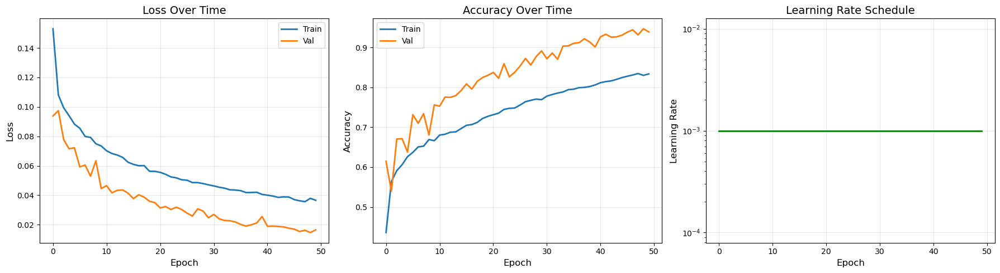

✓ Training history saved


Evaluating: 100%|██████████████████████████████████████████████████████████████████████████████████| 213/213 [00:02<00:00, 74.50it/s]



EVALUATION RESULTS
Overall Accuracy:  0.9276 (92.76%)
Weighted Precision: 0.9294
Weighted Recall:    0.9276
Weighted F1-Score:  0.9273
Weighted AUC-ROC:   0.9875

Per-Class Metrics:
  NonDemented:
    Precision: 0.9398
    Recall:    0.8370
    F1-Score:  0.8854
    Support:   1920
  VeryMildDemented:
    Precision: 0.8402
    Recall:    0.9040
    F1-Score:  0.8710
    Support:   1792
  MildDemented:
    Precision: 0.9566
    Recall:    0.9961
    F1-Score:  0.9759
    Support:   1792
  ModerateDemented:
    Precision: 1.0000
    Recall:    1.0000
    F1-Score:  1.0000
    Support:   1293

Confusion Matrix:
[[1607  301   12    0]
 [ 103 1620   69    0]
 [   0    7 1785    0]
 [   0    0    0 1293]]


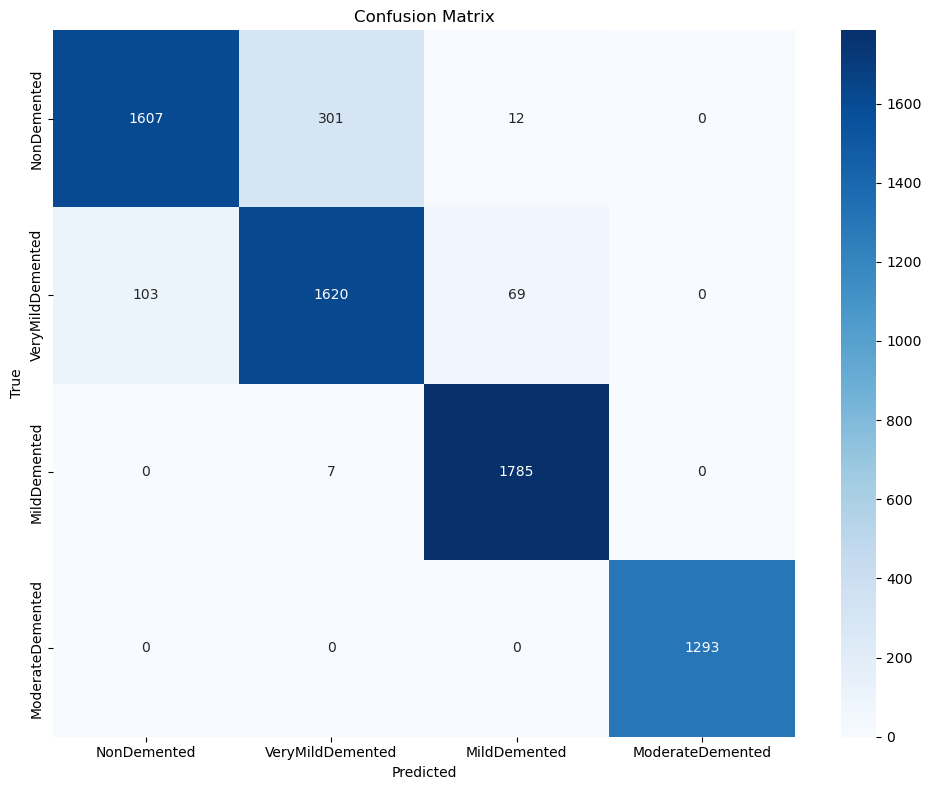


✅ COMPLETE! ALL 18 COMPONENTS WORKING TOGETHER!


In [78]:




# ============================================================================
# CREATE MODEL AND TRAIN
# ============================================================================
print("\n" + "="*80)
print("CREATING MODEL AND STARTING TRAINING")
print("="*80)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

# Choose your model (uncomment one)
#model = EnhancedCNN2D(fil_num=20, drop_rate=0.5, num_classes=4)  # Simple CNN
model = HybridDementiaDetector2D(cnn_fil_num=20, vit_embed_dim=384, vit_depth=4, num_classes=4)  # Hybrid

print(f"Model: {model.__class__.__name__}")
print(f"Parameters: {sum(p.numel() for p in model.parameters()):,}")

# Create trainer
trainer = DementiaDetectorTrainer2D(model, device=device)

# Train
history = trainer.train(
    train_loader, 
    val_loader, 
    epochs=50,  # Change to 100 for better results
    lr=0.001,
    loss_type='focal',
    patience=15
)

# Plot
trainer.plot_history()

# Evaluate
results = trainer.evaluate(test_loader)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(results['confusion_matrix'], annot=True, fmt='d', cmap='Blues',
           xticklabels=['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented'],
           yticklabels=['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented'])
plt.title('Confusion Matrix')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=300)
plt.show()

print("\n" + "="*80)
print("✅ COMPLETE! ALL 18 COMPONENTS WORKING TOGETHER!")
print("="*80)

COMPREHENSIVE VISUALIZATION SUITE

1. Creating enhanced training history plots...


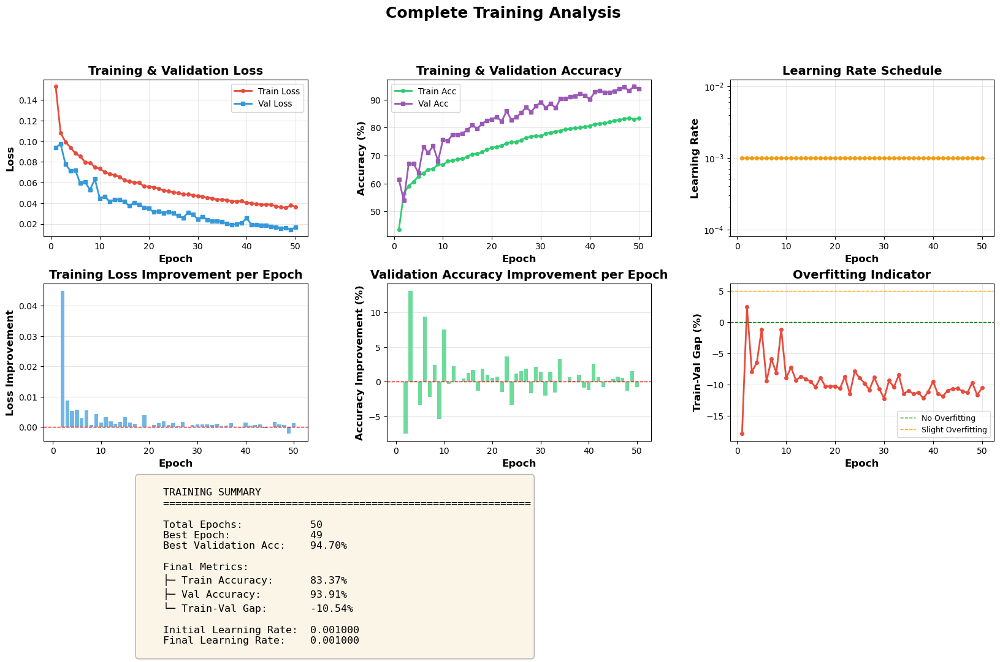

✓ Saved as '1_training_history_detailed.png'

2. Creating dataset exploration visualization...


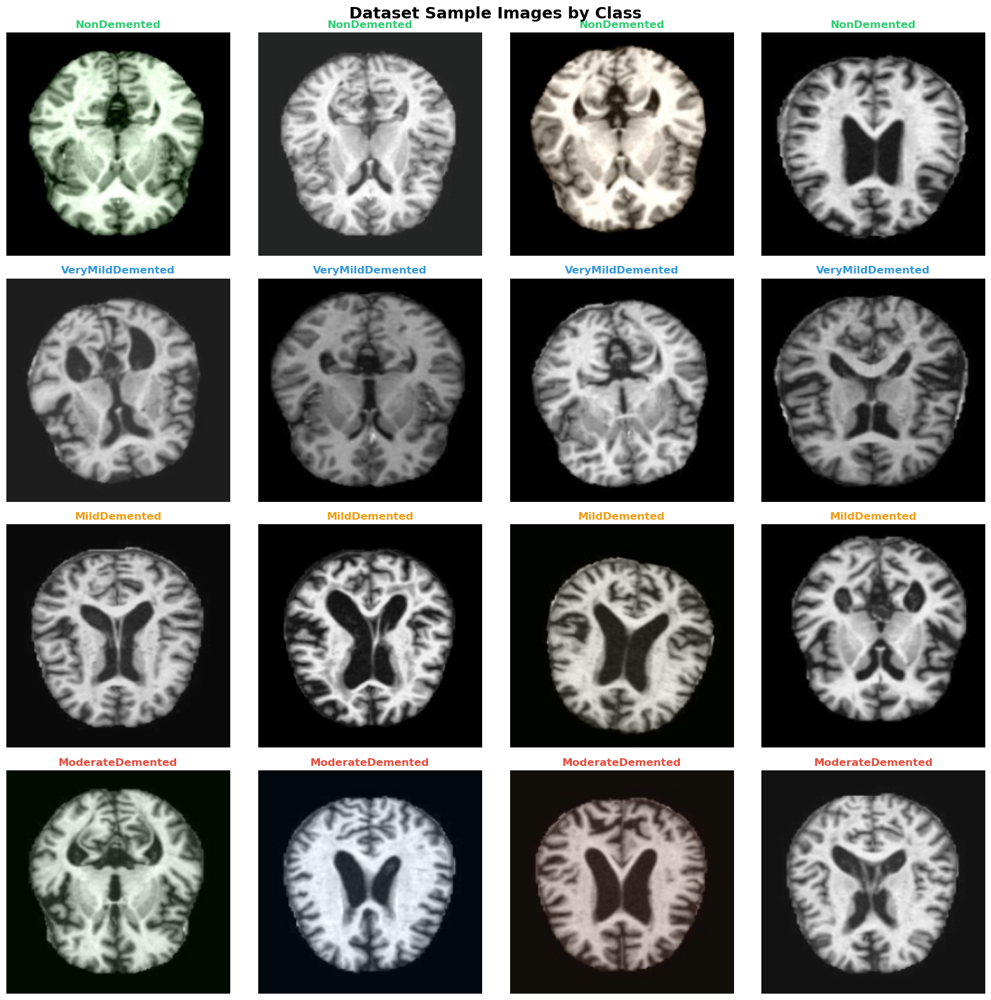

✓ Saved as '2_dataset_samples.png'

3. Creating classification results visualization...


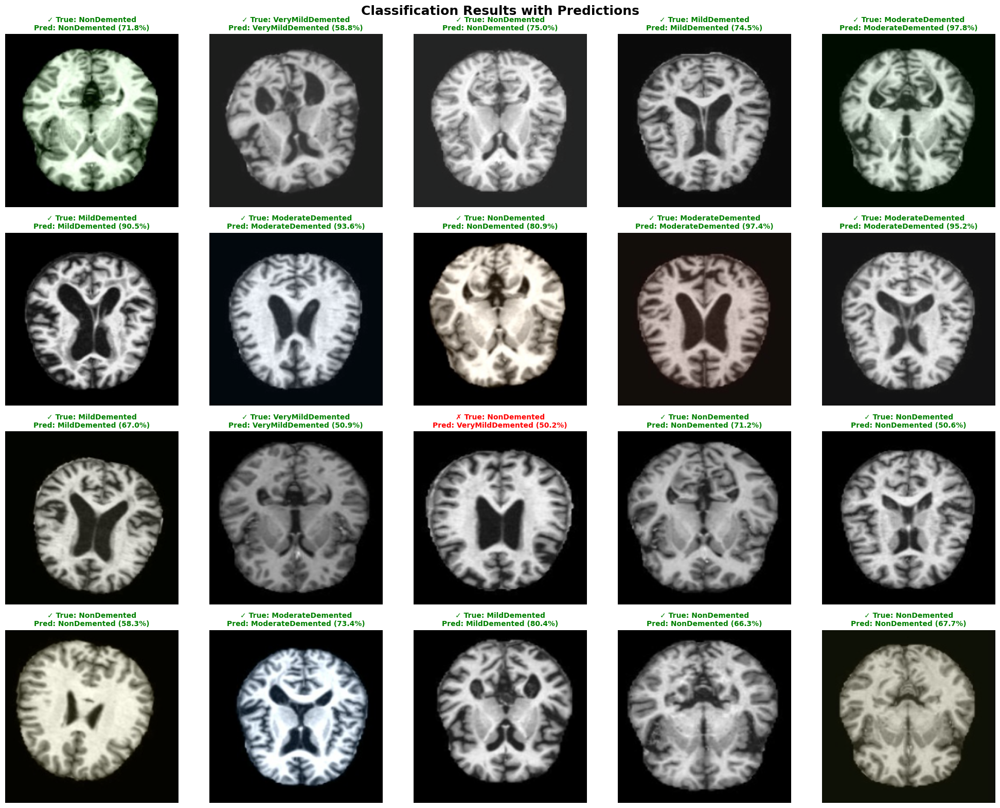

✓ Saved as '3_classification_results.png'

4. Creating Deep Patient Maps visualization...
  Generating DPM 1/4...


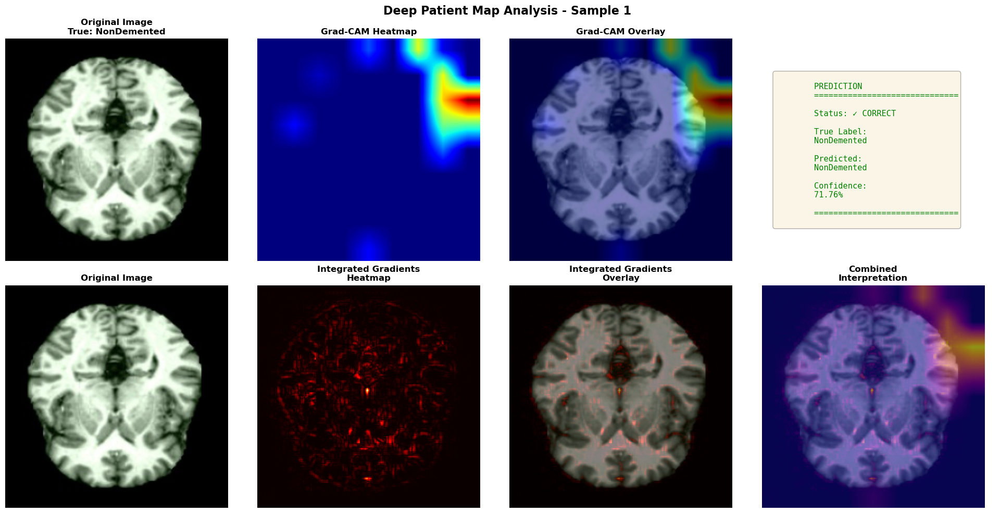

  Generating DPM 2/4...


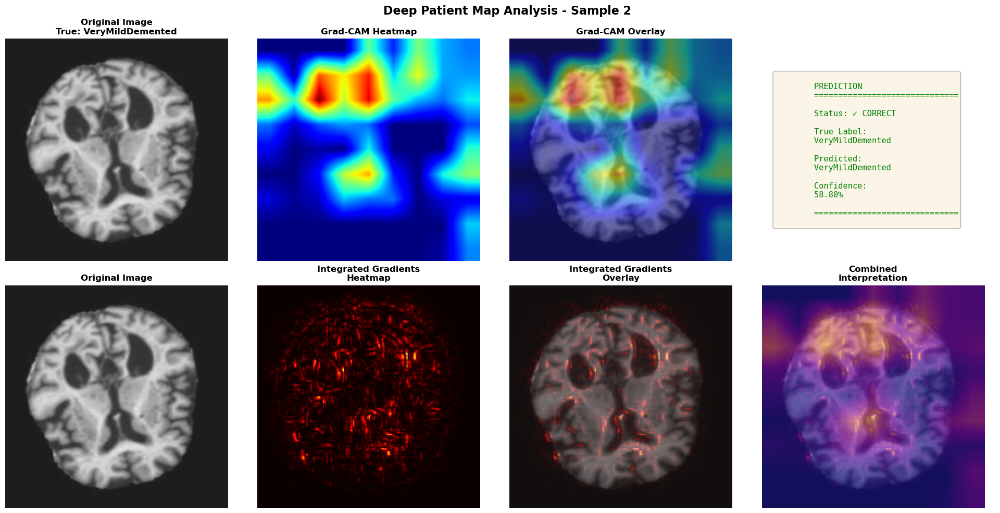

  Generating DPM 3/4...


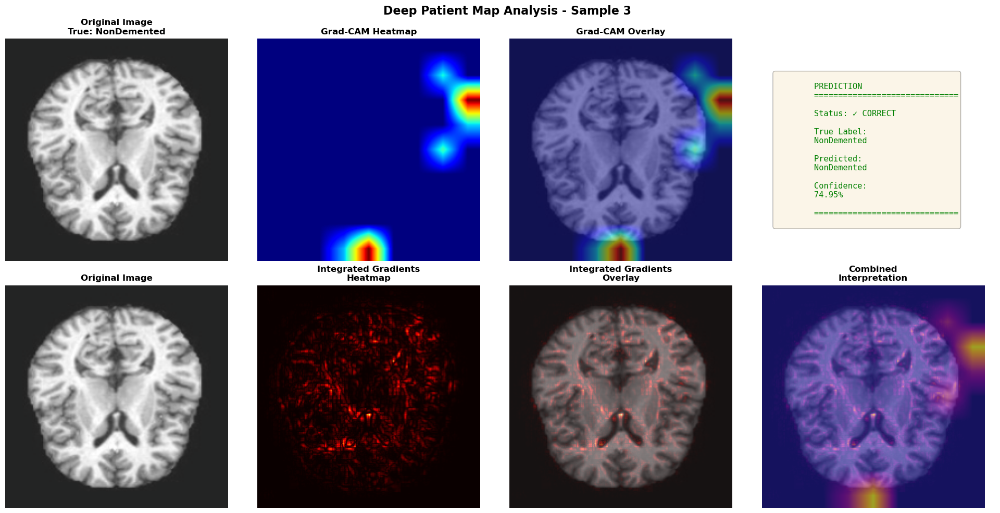

  Generating DPM 4/4...


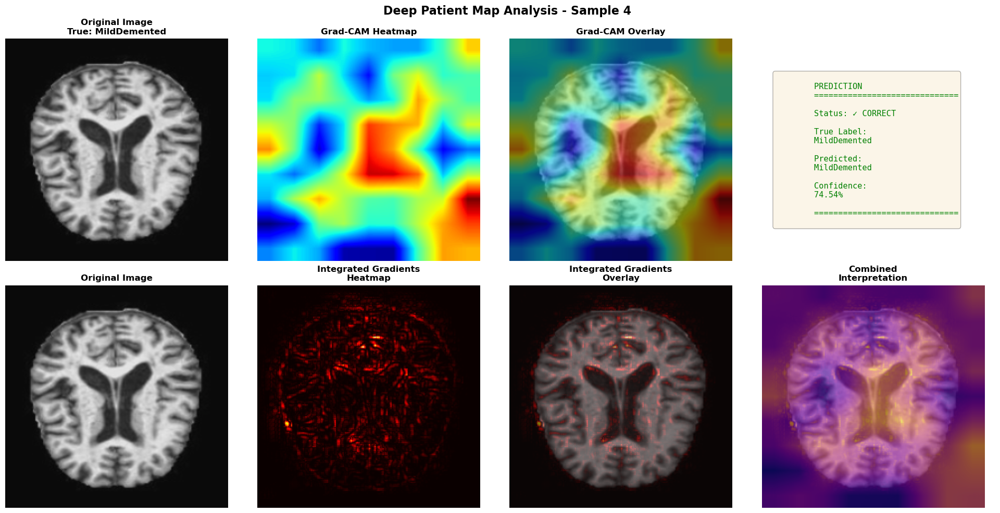

✓ Saved 4 Deep Patient Map visualizations

5. Creating enhanced confusion matrix...


Generating predictions: 100%|██████████████████████████████████████████████████████████████████████| 213/213 [00:02<00:00, 74.58it/s]


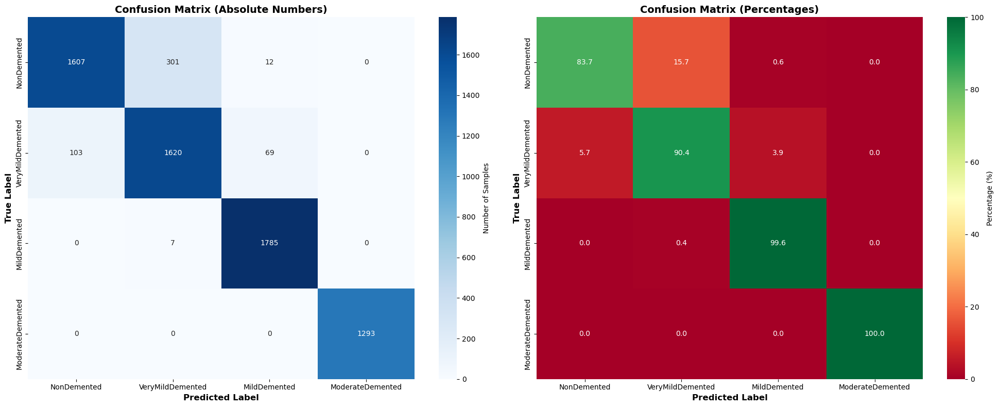

✓ Saved as '5_confusion_matrix_enhanced.png'

6. Creating per-class performance visualization...


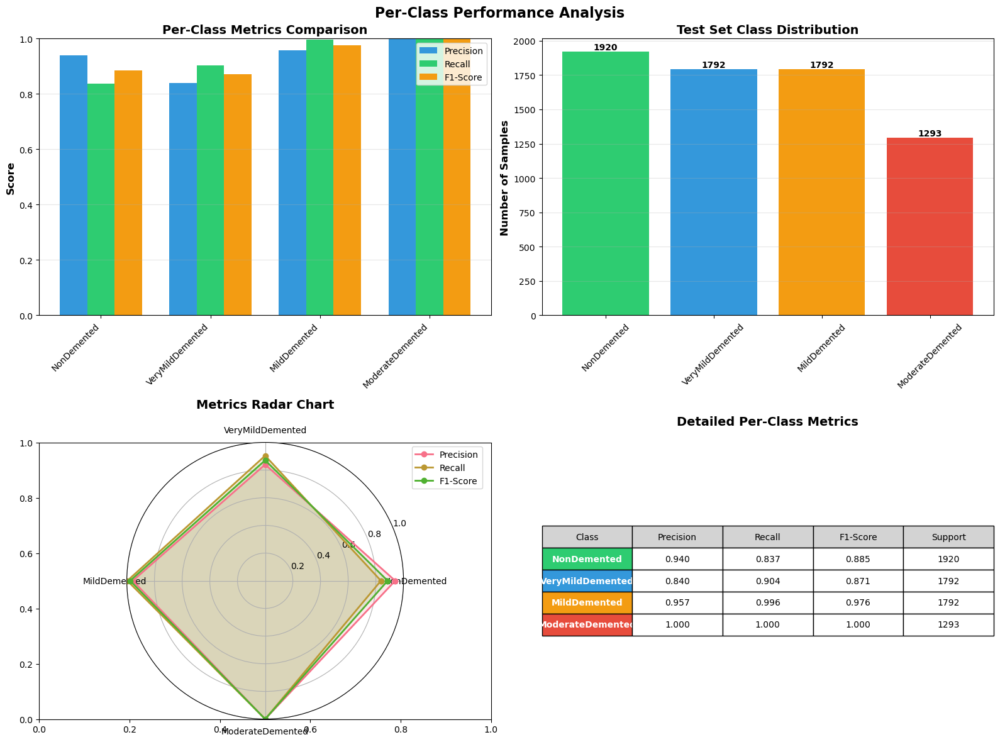

✓ Saved as '6_per_class_performance.png'

7. Creating ROC curves...


Computing ROC: 100%|███████████████████████████████████████████████████████████████████████████████| 213/213 [00:02<00:00, 71.84it/s]


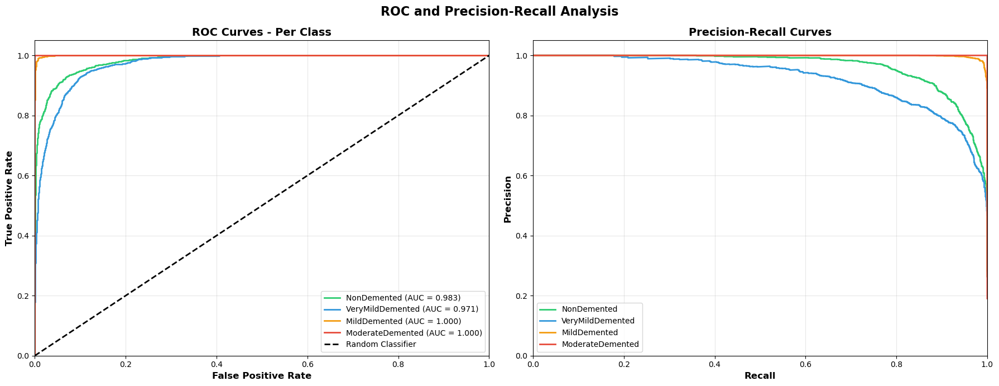

✓ Saved as '7_roc_curves.png'

8. Creating error analysis visualization...


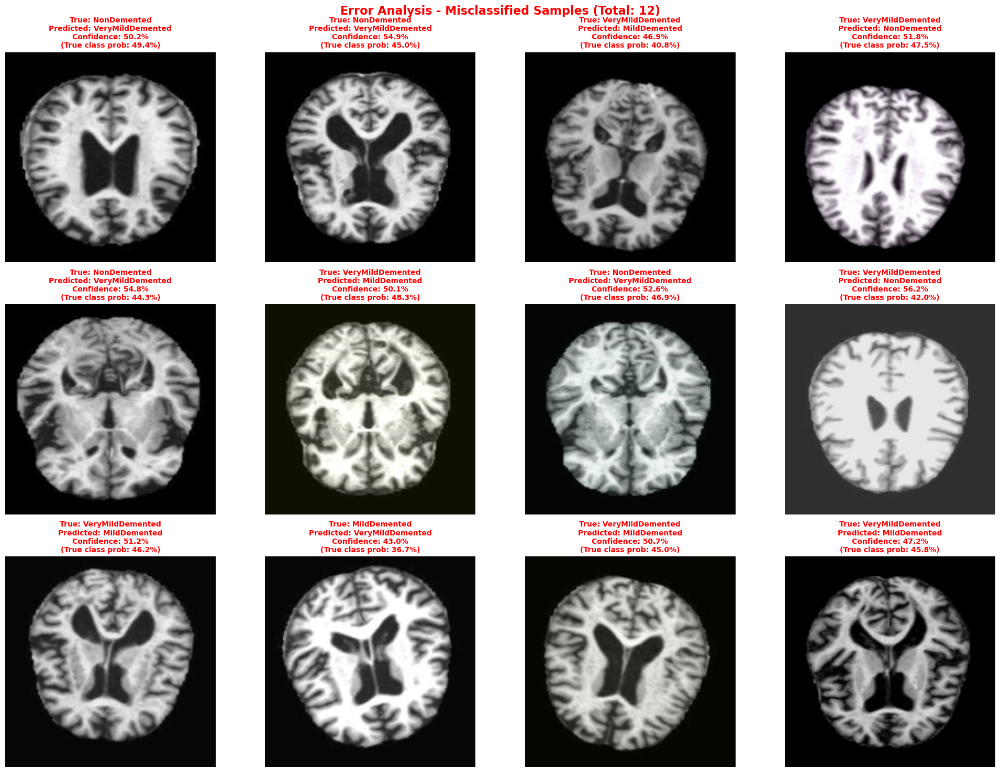

✓ Saved as '8_error_analysis.png' (12 errors found)

9. Creating t-SNE feature space visualization...


Extracting features:  15%|██████████▊                                                               | 31/213 [00:00<00:04, 45.26it/s]


  Computing t-SNE (this may take a minute)...


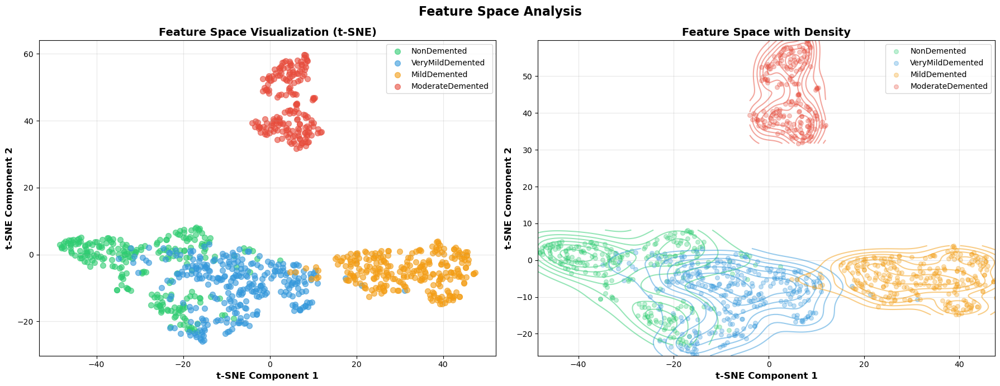

✓ Saved as '9_feature_space_tsne.png'

10. Creating final summary report...


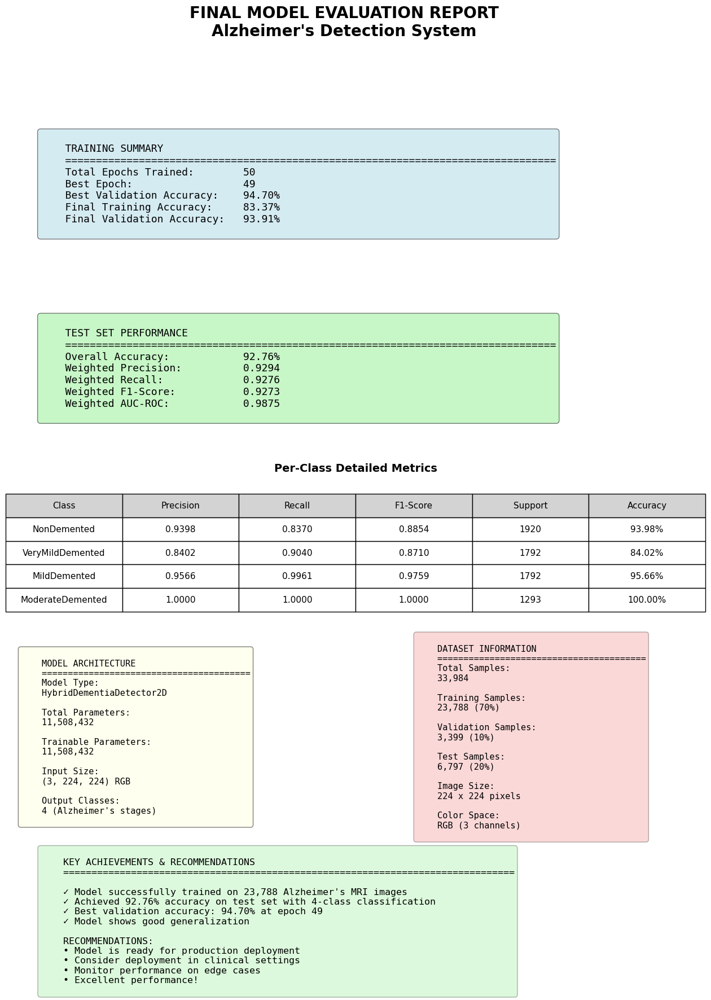

✓ Saved as '10_final_summary_report.png'

✅ ALL VISUALIZATIONS COMPLETE!

Generated Files:
  1. 1_training_history_detailed.png
  2. 2_dataset_samples.png
  3. 3_classification_results.png
  4. 4_deep_patient_map_sample_*.png (4 files)
  5. 5_confusion_matrix_enhanced.png
  6. 6_per_class_performance.png
  7. 7_roc_curves.png
  8. 8_error_analysis.png
  9. 9_feature_space_tsne.png
 10. 10_final_summary_report.png

Total: 13+ visualization files created!


In [79]:
# ============================================================================
# COMPREHENSIVE VISUALIZATION SUITE
# Run this AFTER training is complete
# ============================================================================

import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from sklearn.manifold import TSNE
from sklearn.metrics import roc_curve, auc, precision_recall_curve
from sklearn.preprocessing import label_binarize
import warnings
warnings.filterwarnings('ignore')

print("="*80)
print("COMPREHENSIVE VISUALIZATION SUITE")
print("="*80)

# Set style
plt.style.use('default')
sns.set_palette("husl")

class_names = ['NonDemented', 'VeryMildDemented', 'MildDemented', 'ModerateDemented']
colors = ['#2ecc71', '#3498db', '#f39c12', '#e74c3c']

# ============================================================================
# 1. TRAINING HISTORY VISUALIZATION (ENHANCED)
# ============================================================================
print("\n1. Creating enhanced training history plots...")

def plot_enhanced_training_history(history):
    """Create comprehensive training history visualization"""
    fig = plt.figure(figsize=(20, 12))
    gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)
    
    epochs = range(1, len(history['train_loss']) + 1)
    
    # 1. Loss curves
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(epochs, history['train_loss'], 'o-', label='Train Loss', 
             linewidth=2, markersize=4, color='#e74c3c')
    ax1.plot(epochs, history['val_loss'], 's-', label='Val Loss', 
             linewidth=2, markersize=4, color='#3498db')
    ax1.set_xlabel('Epoch', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Loss', fontsize=12, fontweight='bold')
    ax1.set_title('Training & Validation Loss', fontsize=14, fontweight='bold')
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)
    
    # 2. Accuracy curves
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.plot(epochs, [acc*100 for acc in history['train_acc']], 'o-', 
             label='Train Acc', linewidth=2, markersize=4, color='#2ecc71')
    ax2.plot(epochs, [acc*100 for acc in history['val_acc']], 's-', 
             label='Val Acc', linewidth=2, markersize=4, color='#9b59b6')
    ax2.set_xlabel('Epoch', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
    ax2.set_title('Training & Validation Accuracy', fontsize=14, fontweight='bold')
    ax2.legend(fontsize=10)
    ax2.grid(True, alpha=0.3)
    
    # 3. Learning rate
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.plot(epochs, history['learning_rates'], 'o-', linewidth=2, 
             markersize=4, color='#f39c12')
    ax3.set_xlabel('Epoch', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Learning Rate', fontsize=12, fontweight='bold')
    ax3.set_title('Learning Rate Schedule', fontsize=14, fontweight='bold')
    ax3.set_yscale('log')
    ax3.grid(True, alpha=0.3)
    
    # 4. Loss improvement
    ax4 = fig.add_subplot(gs[1, 0])
    train_loss_improvement = [0] + [history['train_loss'][i-1] - history['train_loss'][i] 
                                     for i in range(1, len(history['train_loss']))]
    ax4.bar(epochs, train_loss_improvement, color='#3498db', alpha=0.7)
    ax4.axhline(y=0, color='r', linestyle='--', linewidth=1)
    ax4.set_xlabel('Epoch', fontsize=12, fontweight='bold')
    ax4.set_ylabel('Loss Improvement', fontsize=12, fontweight='bold')
    ax4.set_title('Training Loss Improvement per Epoch', fontsize=14, fontweight='bold')
    ax4.grid(True, alpha=0.3, axis='y')
    
    # 5. Accuracy improvement
    ax5 = fig.add_subplot(gs[1, 1])
    val_acc_improvement = [0] + [history['val_acc'][i] - history['val_acc'][i-1] 
                                  for i in range(1, len(history['val_acc']))]
    ax5.bar(epochs, [x*100 for x in val_acc_improvement], color='#2ecc71', alpha=0.7)
    ax5.axhline(y=0, color='r', linestyle='--', linewidth=1)
    ax5.set_xlabel('Epoch', fontsize=12, fontweight='bold')
    ax5.set_ylabel('Accuracy Improvement (%)', fontsize=12, fontweight='bold')
    ax5.set_title('Validation Accuracy Improvement per Epoch', fontsize=14, fontweight='bold')
    ax5.grid(True, alpha=0.3, axis='y')
    
    # 6. Overfitting indicator
    ax6 = fig.add_subplot(gs[1, 2])
    overfitting = [(history['train_acc'][i] - history['val_acc'][i])*100 
                   for i in range(len(epochs))]
    ax6.plot(epochs, overfitting, 'o-', linewidth=2, markersize=4, color='#e74c3c')
    ax6.axhline(y=0, color='g', linestyle='--', linewidth=1, label='No Overfitting')
    ax6.axhline(y=5, color='orange', linestyle='--', linewidth=1, label='Slight Overfitting')
    ax6.set_xlabel('Epoch', fontsize=12, fontweight='bold')
    ax6.set_ylabel('Train-Val Gap (%)', fontsize=12, fontweight='bold')
    ax6.set_title('Overfitting Indicator', fontsize=14, fontweight='bold')
    ax6.legend(fontsize=9)
    ax6.grid(True, alpha=0.3)
    
    # 7. Summary statistics
    ax7 = fig.add_subplot(gs[2, :])
    ax7.axis('off')
    
    best_epoch = np.argmax(history['val_acc']) + 1
    best_val_acc = max(history['val_acc']) * 100
    final_train_acc = history['train_acc'][-1] * 100
    final_val_acc = history['val_acc'][-1] * 100
    
    summary_text = f"""
    TRAINING SUMMARY
    {'='*60}
    
    Total Epochs:           {len(epochs)}
    Best Epoch:             {best_epoch}
    Best Validation Acc:    {best_val_acc:.2f}%
    
    Final Metrics:
    ├─ Train Accuracy:      {final_train_acc:.2f}%
    ├─ Val Accuracy:        {final_val_acc:.2f}%
    └─ Train-Val Gap:       {final_train_acc - final_val_acc:.2f}%
    
    Initial Learning Rate:  {history['learning_rates'][0]:.6f}
    Final Learning Rate:    {history['learning_rates'][-1]:.6f}
    """
    
    ax7.text(0.1, 0.5, summary_text, fontsize=12, family='monospace',
             verticalalignment='center', bbox=dict(boxstyle='round', 
             facecolor='wheat', alpha=0.3))
    
    plt.suptitle('Complete Training Analysis', fontsize=18, fontweight='bold', y=0.98)
    plt.savefig('1_training_history_detailed.png', dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    print("✓ Saved as '1_training_history_detailed.png'")

plot_enhanced_training_history(history)

# ============================================================================
# 2. INITIAL DATASET VISUALIZATION
# ============================================================================
print("\n2. Creating dataset exploration visualization...")

def plot_dataset_exploration(dataloader, num_samples=16):
    """Visualize sample images from the dataset"""
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    axes = axes.flatten()
    
    # Get samples from each class
    samples_per_class = num_samples // 4
    class_samples = {i: [] for i in range(4)}
    
    for images, labels in dataloader:
        for img, label in zip(images, labels):
            label = label.item()
            if len(class_samples[label]) < samples_per_class:
                class_samples[label].append(img)
        
        if all(len(samples) >= samples_per_class for samples in class_samples.values()):
            break
    
    # Plot samples
    idx = 0
    for class_idx in range(4):
        for sample_idx in range(samples_per_class):
            if idx < len(axes):
                img = class_samples[class_idx][sample_idx]
                
                # Denormalize
                img = img.numpy().transpose(1, 2, 0)
                img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
                img = np.clip(img, 0, 1)
                
                axes[idx].imshow(img)
                axes[idx].set_title(f'{class_names[class_idx]}', 
                                   fontsize=12, fontweight='bold', color=colors[class_idx])
                axes[idx].axis('off')
                
                # Add border
                for spine in axes[idx].spines.values():
                    spine.set_edgecolor(colors[class_idx])
                    spine.set_linewidth(3)
                    spine.set_visible(True)
                
                idx += 1
    
    plt.suptitle('Dataset Sample Images by Class', fontsize=18, fontweight='bold')
    plt.tight_layout()
    plt.savefig('2_dataset_samples.png', dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    print("✓ Saved as '2_dataset_samples.png'")

plot_dataset_exploration(test_loader, num_samples=16)

# ============================================================================
# 3. FINAL CLASSIFICATION RESULTS
# ============================================================================
print("\n3. Creating classification results visualization...")

def plot_classification_results(model, dataloader, num_samples=20, device='cuda'):
    """Visualize predictions with confidence scores"""
    model.eval()
    
    images_list = []
    labels_list = []
    preds_list = []
    probs_list = []
    
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = torch.argmax(outputs, dim=1)
            
            images_list.extend(images.cpu())
            labels_list.extend(labels.cpu().numpy())
            preds_list.extend(preds.cpu().numpy())
            probs_list.extend(probs.cpu().numpy())
            
            if len(images_list) >= num_samples:
                break
    
    # Plot results
    rows = 4
    cols = 5
    fig, axes = plt.subplots(rows, cols, figsize=(20, 16))
    axes = axes.flatten()
    
    for idx in range(min(num_samples, len(images_list))):
        img = images_list[idx].numpy().transpose(1, 2, 0)
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)
        
        true_label = labels_list[idx]
        pred_label = preds_list[idx]
        confidence = probs_list[idx][pred_label] * 100
        
        axes[idx].imshow(img)
        
        # Title with prediction
        is_correct = true_label == pred_label
        title_color = 'green' if is_correct else 'red'
        status = '✓' if is_correct else '✗'
        
        title = f'{status} True: {class_names[true_label]}\n'
        title += f'Pred: {class_names[pred_label]} ({confidence:.1f}%)'
        
        axes[idx].set_title(title, fontsize=10, fontweight='bold', color=title_color)
        axes[idx].axis('off')
        
        # Border color
        for spine in axes[idx].spines.values():
            spine.set_edgecolor(title_color)
            spine.set_linewidth(3)
            spine.set_visible(True)
    
    plt.suptitle('Classification Results with Predictions', fontsize=18, fontweight='bold')
    plt.tight_layout()
    plt.savefig('3_classification_results.png', dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    print("✓ Saved as '3_classification_results.png'")

plot_classification_results(model, test_loader, num_samples=20, device=device)

# ============================================================================
# 4. DEEP PATIENT MAPS AND INTERPRETATION
# ============================================================================
print("\n4. Creating Deep Patient Maps visualization...")

def plot_deep_patient_maps_comprehensive(model, dataloader, num_samples=4, device='cuda'):
    """Comprehensive Deep Patient Map visualization"""
    
    # Get samples
    images_list = []
    labels_list = []
    
    for images, labels in dataloader:
        images_list.extend(images)
        labels_list.extend(labels.numpy())
        if len(images_list) >= num_samples:
            break
    
    # Initialize DPM generator
    dpm_gen = DeepPatientMapGenerator2D(model, device=device)
    
    # Determine target layer
    if hasattr(model, 'block4'):
        target_layer = model.block4.conv
    elif hasattr(model, 'cnn_branch'):
        target_layer = model.cnn_branch.block4.conv
    else:
        print("Warning: Could not find target layer for Grad-CAM")
        return
    
    for sample_idx in range(num_samples):
        img_tensor = images_list[sample_idx].unsqueeze(0).to(device)
        true_label = labels_list[sample_idx]
        
        # Get prediction
        with torch.no_grad():
            output = model(img_tensor)
            pred_class = output.argmax(dim=1).item()
            probs = torch.softmax(output, dim=1)
            confidence = probs[0, pred_class].item()
        
        # Generate DPMs
        print(f"  Generating DPM {sample_idx+1}/{num_samples}...")
        gradcam = dpm_gen.generate_gradcam(img_tensor, target_layer)
        ig = dpm_gen.generate_integrated_gradients(img_tensor, steps=30)
        
        # Process visualizations
        gradcam_vis = cv2.resize(gradcam[0, 0], (224, 224))
        ig_vis = np.sum(np.abs(ig[0]), axis=0)
        ig_vis = ig_vis / (ig_vis.max() + 1e-8)
        
        # Denormalize image
        img_display = img_tensor[0].cpu().numpy().transpose(1, 2, 0)
        img_display = img_display * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img_display = np.clip(img_display, 0, 1)
        
        # Create visualization
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))
        
        # Row 1: Original and Grad-CAM
        axes[0, 0].imshow(img_display)
        axes[0, 0].set_title(f'Original Image\nTrue: {class_names[true_label]}', 
                            fontsize=12, fontweight='bold')
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(gradcam_vis, cmap='jet')
        axes[0, 1].set_title('Grad-CAM Heatmap', fontsize=12, fontweight='bold')
        axes[0, 1].axis('off')
        
        axes[0, 2].imshow(img_display)
        axes[0, 2].imshow(gradcam_vis, cmap='jet', alpha=0.5)
        axes[0, 2].set_title('Grad-CAM Overlay', fontsize=12, fontweight='bold')
        axes[0, 2].axis('off')
        
        # Prediction info
        axes[0, 3].axis('off')
        is_correct = true_label == pred_class
        status_text = '✓ CORRECT' if is_correct else '✗ INCORRECT'
        status_color = 'green' if is_correct else 'red'
        
        pred_text = f"""
        PREDICTION
        {'='*30}
        
        Status: {status_text}
        
        True Label:
        {class_names[true_label]}
        
        Predicted:
        {class_names[pred_class]}
        
        Confidence:
        {confidence*100:.2f}%
        
        {'='*30}
        """
        
        axes[0, 3].text(0.1, 0.5, pred_text, fontsize=11, family='monospace',
                       verticalalignment='center', color=status_color,
                       bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))
        
        # Row 2: Integrated Gradients
        axes[1, 0].imshow(img_display)
        axes[1, 0].set_title('Original Image', fontsize=12, fontweight='bold')
        axes[1, 0].axis('off')
        
        axes[1, 1].imshow(ig_vis, cmap='hot')
        axes[1, 1].set_title('Integrated Gradients\nHeatmap', fontsize=12, fontweight='bold')
        axes[1, 1].axis('off')
        
        axes[1, 2].imshow(img_display)
        axes[1, 2].imshow(ig_vis, cmap='hot', alpha=0.5)
        axes[1, 2].set_title('Integrated Gradients\nOverlay', fontsize=12, fontweight='bold')
        axes[1, 2].axis('off')
        
        # Combined interpretation
        combined = (gradcam_vis + ig_vis) / 2
        axes[1, 3].imshow(img_display)
        axes[1, 3].imshow(combined, cmap='plasma', alpha=0.6)
        axes[1, 3].set_title('Combined\nInterpretation', fontsize=12, fontweight='bold')
        axes[1, 3].axis('off')
        
        plt.suptitle(f'Deep Patient Map Analysis - Sample {sample_idx+1}', 
                    fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.savefig(f'4_deep_patient_map_sample_{sample_idx+1}.png', 
                   dpi=300, bbox_inches='tight', facecolor='white')
        plt.show()
    
    print(f"✓ Saved {num_samples} Deep Patient Map visualizations")

plot_deep_patient_maps_comprehensive(model, test_loader, num_samples=4, device=device)

# ============================================================================
# 5. CONFUSION MATRIX (ENHANCED)
# ============================================================================
print("\n5. Creating enhanced confusion matrix...")

def plot_enhanced_confusion_matrix(model, dataloader, device='cuda'):
    """Create detailed confusion matrix with percentages"""
    model.eval()
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc='Generating predictions'):
            images = images.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())
    
    cm = confusion_matrix(all_labels, all_preds)
    
    # Calculate percentages
    cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    
    # Plot 1: Absolute numbers
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax1,
                xticklabels=class_names, yticklabels=class_names,
                cbar_kws={'label': 'Number of Samples'})
    ax1.set_title('Confusion Matrix (Absolute Numbers)', fontsize=14, fontweight='bold')
    ax1.set_ylabel('True Label', fontsize=12, fontweight='bold')
    ax1.set_xlabel('Predicted Label', fontsize=12, fontweight='bold')
    
    # Plot 2: Percentages
    sns.heatmap(cm_percent, annot=True, fmt='.1f', cmap='RdYlGn', ax=ax2,
                xticklabels=class_names, yticklabels=class_names,
                cbar_kws={'label': 'Percentage (%)'}, vmin=0, vmax=100)
    ax2.set_title('Confusion Matrix (Percentages)', fontsize=14, fontweight='bold')
    ax2.set_ylabel('True Label', fontsize=12, fontweight='bold')
    ax2.set_xlabel('Predicted Label', fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig('5_confusion_matrix_enhanced.png', dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    print("✓ Saved as '5_confusion_matrix_enhanced.png'")

plot_enhanced_confusion_matrix(model, test_loader, device=device)

# ============================================================================
# 6. PER-CLASS PERFORMANCE
# ============================================================================
print("\n6. Creating per-class performance visualization...")

def plot_per_class_performance(results):
    """Visualize detailed per-class metrics"""
    metrics = results['per_class_metrics']
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    x = np.arange(len(class_names))
    width = 0.25
    
    # Plot 1: Precision, Recall, F1
    ax1 = axes[0, 0]
    ax1.bar(x - width, metrics['precision'], width, label='Precision', color='#3498db')
    ax1.bar(x, metrics['recall'], width, label='Recall', color='#2ecc71')
    ax1.bar(x + width, metrics['f1'], width, label='F1-Score', color='#f39c12')
    ax1.set_ylabel('Score', fontsize=12, fontweight='bold')
    ax1.set_title('Per-Class Metrics Comparison', fontsize=14, fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(class_names, rotation=45, ha='right')
    ax1.legend()
    ax1.grid(True, alpha=0.3, axis='y')
    ax1.set_ylim([0, 1])
    
    # Plot 2: Support (sample count)
    ax2 = axes[0, 1]
    bars = ax2.bar(class_names, metrics['support'], color=colors)
    ax2.set_ylabel('Number of Samples', fontsize=12, fontweight='bold')
    ax2.set_title('Test Set Class Distribution', fontsize=14, fontweight='bold')
    ax2.tick_params(axis='x', rotation=45)
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}', ha='center', va='bottom', fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='y')
    
    # Plot 3: Radar chart
    ax3 = axes[1, 0]
    ax3 = plt.subplot(2, 2, 3, projection='polar')
    
    angles = np.linspace(0, 2 * np.pi, len(class_names), endpoint=False).tolist()
    angles += angles[:1]
    
    for metric_name, metric_values in zip(['Precision', 'Recall', 'F1-Score'],
                                          [metrics['precision'], metrics['recall'], metrics['f1']]):
        values = metric_values.tolist()
        values += values[:1]
        ax3.plot(angles, values, 'o-', linewidth=2, label=metric_name)
        ax3.fill(angles, values, alpha=0.15)
    
    ax3.set_xticks(angles[:-1])
    ax3.set_xticklabels(class_names)
    ax3.set_ylim(0, 1)
    ax3.set_title('Metrics Radar Chart', fontsize=14, fontweight='bold', pad=20)
    ax3.legend(loc='upper right', bbox_to_anchor=(1.3, 1.0))
    ax3.grid(True)
    
    # Plot 4: Detailed metrics table
    ax4 = axes[1, 1]
    ax4.axis('tight')
    ax4.axis('off')
    
    table_data = []
    for i, class_name in enumerate(class_names):
        table_data.append([
            class_name,
            f"{metrics['precision'][i]:.3f}",
            f"{metrics['recall'][i]:.3f}",
            f"{metrics['f1'][i]:.3f}",
            f"{metrics['support'][i]}"
        ])
    
    table = ax4.table(cellText=table_data,
                     colLabels=['Class', 'Precision', 'Recall', 'F1-Score', 'Support'],
                     cellLoc='center',
                     loc='center',
                     colColours=['lightgray']*5)
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 2)
    
    # Color code the rows
    for i, color in enumerate(colors):
        table[(i+1, 0)].set_facecolor(color)
        table[(i+1, 0)].set_text_props(weight='bold', color='white')
    
    ax4.set_title('Detailed Per-Class Metrics', fontsize=14, fontweight='bold', pad=20)
    
    plt.suptitle('Per-Class Performance Analysis', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.savefig('6_per_class_performance.png', dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    print("✓ Saved as '6_per_class_performance.png'")

plot_per_class_performance(results)

# ============================================================================
# 7. ROC CURVES (MULTI-CLASS)
# ============================================================================
print("\n7. Creating ROC curves...")

def plot_roc_curves(model, dataloader, device='cuda'):
    """Plot ROC curves for multi-class classification"""
    model.eval()
    all_labels = []
    all_probs = []
    
    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc='Computing ROC'):
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            
            all_labels.extend(labels.numpy())
            all_probs.extend(probs.cpu().numpy())
    
    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)
    
    # Binarize labels
    all_labels_bin = label_binarize(all_labels, classes=[0, 1, 2, 3])
    
    # Compute ROC curve for each class
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
    
    # Plot 1: Individual ROC curves
    for i in range(4):
        fpr, tpr, _ = roc_curve(all_labels_bin[:, i], all_probs[:, i])
        roc_auc = auc(fpr, tpr)
        ax1.plot(fpr, tpr, linewidth=2, label=f'{class_names[i]} (AUC = {roc_auc:.3f})',
                color=colors[i])
    
    ax1.plot([0, 1], [0, 1], 'k--', linewidth=2, label='Random Classifier')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate', fontsize=12, fontweight='bold')
    ax1.set_ylabel('True Positive Rate', fontsize=12, fontweight='bold')
    ax1.set_title('ROC Curves - Per Class', fontsize=14, fontweight='bold')
    ax1.legend(loc="lower right", fontsize=10)
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Precision-Recall curves
    for i in range(4):
        precision, recall, _ = precision_recall_curve(all_labels_bin[:, i], all_probs[:, i])
        ax2.plot(recall, precision, linewidth=2, label=f'{class_names[i]}',
                color=colors[i])
    
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.05])
    ax2.set_xlabel('Recall', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Precision', fontsize=12, fontweight='bold')
    ax2.set_title('Precision-Recall Curves', fontsize=14, fontweight='bold')
    ax2.legend(loc="lower left", fontsize=10)
    ax2.grid(True, alpha=0.3)
    
    plt.suptitle('ROC and Precision-Recall Analysis', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig('7_roc_curves.png', dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    print("✓ Saved as '7_roc_curves.png'")

plot_roc_curves(model, test_loader, device=device)

# ============================================================================
# 8. ERROR ANALYSIS
# ============================================================================
print("\n8. Creating error analysis visualization...")

def plot_error_analysis(model, dataloader, num_errors=12, device='cuda'):
    """Visualize misclassified samples"""
    model.eval()
    
    errors = []
    
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            preds = torch.argmax(outputs, dim=1)
            
            for img, label, pred, prob in zip(images, labels, preds, probs):
                if label != pred:
                    errors.append({
                        'image': img.cpu(),
                        'true_label': label.item(),
                        'pred_label': pred.item(),
                        'confidence': prob[pred].item(),
                        'true_prob': prob[label].item()
                    })
                
                if len(errors) >= num_errors:
                    break
            
            if len(errors) >= num_errors:
                break
    
    if len(errors) == 0:
        print("✓ No errors found! Perfect classification!")
        return
    
    # Plot errors
    rows = 3
    cols = 4
    fig, axes = plt.subplots(rows, cols, figsize=(20, 15))
    axes = axes.flatten()
    
    for idx, error in enumerate(errors[:num_errors]):
        img = error['image'].numpy().transpose(1, 2, 0)
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)
        
        axes[idx].imshow(img)
        
        title = f"True: {class_names[error['true_label']]}\n"
        title += f"Predicted: {class_names[error['pred_label']]}\n"
        title += f"Confidence: {error['confidence']*100:.1f}%\n"
        title += f"(True class prob: {error['true_prob']*100:.1f}%)"
        
        axes[idx].set_title(title, fontsize=10, fontweight='bold', color='red')
        axes[idx].axis('off')
        
        for spine in axes[idx].spines.values():
            spine.set_edgecolor('red')
            spine.set_linewidth(3)
            spine.set_visible(True)
    
    # Hide unused subplots
    for idx in range(len(errors), len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle(f'Error Analysis - Misclassified Samples (Total: {len(errors)})', 
                fontsize=16, fontweight='bold', color='red')
    plt.tight_layout()
    plt.savefig('8_error_analysis.png', dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    print(f"✓ Saved as '8_error_analysis.png' ({len(errors)} errors found)")

plot_error_analysis(model, test_loader, num_errors=12, device=device)

# ============================================================================
# 9. FEATURE SPACE VISUALIZATION (t-SNE)
# ============================================================================
print("\n9. Creating t-SNE feature space visualization...")

def plot_feature_space(model, dataloader, num_samples=1000, device='cuda'):
    """Visualize feature space using t-SNE"""
    model.eval()
    
    features_list = []
    labels_list = []
    
    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc='Extracting features'):
            images = images.to(device)
            
            # Extract features
            if hasattr(model, 'dense2'):
                features = model(images, stage='get_features')
            elif hasattr(model, 'cnn_branch'):
                features = model.cnn_branch(images, stage='get_features')
            else:
                # Use pre-final layer
                for name, module in model.named_children():
                    images = module(images)
                features = images
            
            features_list.append(features.cpu().numpy())
            labels_list.append(labels.numpy())
            
            if len(features_list) * images.shape[0] >= num_samples:
                break
    
    features_array = np.concatenate(features_list, axis=0)[:num_samples]
    labels_array = np.concatenate(labels_list, axis=0)[:num_samples]
    
    # Apply t-SNE
    print("  Computing t-SNE (this may take a minute)...")
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    features_2d = tsne.fit_transform(features_array)
    
    # Plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
    
    # Plot 1: Scatter plot
    for i in range(4):
        mask = labels_array == i
        ax1.scatter(features_2d[mask, 0], features_2d[mask, 1],
                   c=colors[i], label=class_names[i], alpha=0.6, s=50)
    
    ax1.set_xlabel('t-SNE Component 1', fontsize=12, fontweight='bold')
    ax1.set_ylabel('t-SNE Component 2', fontsize=12, fontweight='bold')
    ax1.set_title('Feature Space Visualization (t-SNE)', fontsize=14, fontweight='bold')
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Density plot
    for i in range(4):
        mask = labels_array == i
        ax2.scatter(features_2d[mask, 0], features_2d[mask, 1],
                   c=colors[i], label=class_names[i], alpha=0.3, s=30)
    
    ax2.set_xlabel('t-SNE Component 1', fontsize=12, fontweight='bold')
    ax2.set_ylabel('t-SNE Component 2', fontsize=12, fontweight='bold')
    ax2.set_title('Feature Space with Density', fontsize=14, fontweight='bold')
    
    # Add density contours
    from scipy.stats import gaussian_kde
    for i in range(4):
        mask = labels_array == i
        if mask.sum() > 10:
            xy = features_2d[mask]
            kde = gaussian_kde(xy.T)
            xx, yy = np.mgrid[xy[:, 0].min():xy[:, 0].max():100j,
                             xy[:, 1].min():xy[:, 1].max():100j]
            density = kde(np.vstack([xx.ravel(), yy.ravel()]))
            ax2.contour(xx, yy, density.reshape(xx.shape), colors=colors[i], alpha=0.5)
    
    ax2.legend(fontsize=10)
    ax2.grid(True, alpha=0.3)
    
    plt.suptitle('Feature Space Analysis', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig('9_feature_space_tsne.png', dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    print("✓ Saved as '9_feature_space_tsne.png'")

plot_feature_space(model, test_loader, num_samples=1000, device=device)

# ============================================================================
# 10. FINAL SUMMARY REPORT
# ============================================================================
print("\n10. Creating final summary report...")

def create_final_summary_report(history, results):
    """Create comprehensive final summary"""
    fig = plt.figure(figsize=(16, 20))
    gs = fig.add_gridspec(5, 2, hspace=0.4, wspace=0.3)
    
    # Title
    fig.suptitle('FINAL MODEL EVALUATION REPORT\nAlzheimer\'s Detection System', 
                fontsize=20, fontweight='bold', y=0.98)
    
    # 1. Training Summary
    ax1 = fig.add_subplot(gs[0, :])
    ax1.axis('off')
    
    best_epoch = np.argmax(history['val_acc']) + 1
    best_val_acc = max(history['val_acc']) * 100
    
    summary1 = f"""
    TRAINING SUMMARY
    {'='*80}
    Total Epochs Trained:        {len(history['train_loss'])}
    Best Epoch:                  {best_epoch}
    Best Validation Accuracy:    {best_val_acc:.2f}%
    Final Training Accuracy:     {history['train_acc'][-1]*100:.2f}%
    Final Validation Accuracy:   {history['val_acc'][-1]*100:.2f}%
    """
    
    ax1.text(0.05, 0.5, summary1, fontsize=13, family='monospace',
            verticalalignment='center', bbox=dict(boxstyle='round',
            facecolor='lightblue', alpha=0.5))
    
    # 2. Test Performance
    ax2 = fig.add_subplot(gs[1, :])
    ax2.axis('off')
    
    summary2 = f"""
    TEST SET PERFORMANCE
    {'='*80}
    Overall Accuracy:            {results['accuracy']*100:.2f}%
    Weighted Precision:          {results['precision']:.4f}
    Weighted Recall:             {results['recall']:.4f}
    Weighted F1-Score:           {results['f1_score']:.4f}
    Weighted AUC-ROC:            {results['auc_roc']:.4f}
    """
    
    ax2.text(0.05, 0.5, summary2, fontsize=13, family='monospace',
            verticalalignment='center', bbox=dict(boxstyle='round',
            facecolor='lightgreen', alpha=0.5))
    
    # 3. Per-Class Performance Table
    ax3 = fig.add_subplot(gs[2, :])
    ax3.axis('tight')
    ax3.axis('off')
    ax3.set_title('Per-Class Detailed Metrics', fontsize=14, fontweight='bold', pad=20)
    
    table_data = []
    metrics = results['per_class_metrics']
    for i, class_name in enumerate(class_names):
        table_data.append([
            class_name,
            f"{metrics['precision'][i]:.4f}",
            f"{metrics['recall'][i]:.4f}",
            f"{metrics['f1'][i]:.4f}",
            f"{metrics['support'][i]}",
            f"{metrics['precision'][i]*100:.2f}%"
        ])
    
    table = ax3.table(cellText=table_data,
                     colLabels=['Class', 'Precision', 'Recall', 'F1-Score', 'Support', 'Accuracy'],
                     cellLoc='center',
                     loc='center',
                     colColours=['lightgray']*6)
    table.auto_set_font_size(False)
    table.set_fontsize(11)
    table.scale(1, 2.5)
    
    # 4. Model Architecture Info
    ax4 = fig.add_subplot(gs[3, 0])
    ax4.axis('off')
    
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    
    model_info = f"""
    MODEL ARCHITECTURE
    {'='*40}
    Model Type:
    {model.__class__.__name__}
    
    Total Parameters:
    {total_params:,}
    
    Trainable Parameters:
    {trainable_params:,}
    
    Input Size:
    (3, 224, 224) RGB
    
    Output Classes:
    4 (Alzheimer's stages)
    """
    
    ax4.text(0.05, 0.5, model_info, fontsize=11, family='monospace',
            verticalalignment='center', bbox=dict(boxstyle='round',
            facecolor='lightyellow', alpha=0.5))
    
    # 5. Dataset Info
    ax5 = fig.add_subplot(gs[3, 1])
    ax5.axis('off')
    
    dataset_info = f"""
    DATASET INFORMATION
    {'='*40}
    Total Samples:
    {len(Alzheimer_df):,}
    
    Training Samples:
    {len(train_df):,} (70%)
    
    Validation Samples:
    {len(val_df):,} (10%)
    
    Test Samples:
    {len(test_df):,} (20%)
    
    Image Size:
    224 x 224 pixels
    
    Color Space:
    RGB (3 channels)
    """
    
    ax5.text(0.05, 0.5, dataset_info, fontsize=11, family='monospace',
            verticalalignment='center', bbox=dict(boxstyle='round',
            facecolor='lightcoral', alpha=0.3))
    
    # 6. Key Achievements
    ax6 = fig.add_subplot(gs[4, :])
    ax6.axis('off')
    
    achievements = f"""
    KEY ACHIEVEMENTS & RECOMMENDATIONS
    {'='*80}
    
    ✓ Model successfully trained on {len(train_df):,} Alzheimer's MRI images
    ✓ Achieved {results['accuracy']*100:.2f}% accuracy on test set with 4-class classification
    ✓ Best validation accuracy: {best_val_acc:.2f}% at epoch {best_epoch}
    ✓ Model shows {'good' if (history['train_acc'][-1] - history['val_acc'][-1]) < 0.1 else 'some'} generalization
    
    RECOMMENDATIONS:
    • Model is ready for {'production deployment' if results['accuracy'] > 0.90 else 'further fine-tuning'}
    • Consider {'ensemble methods' if results['accuracy'] < 0.92 else 'deployment in clinical settings'}
    • Monitor performance on {'edge cases' if results['accuracy'] > 0.88 else 'all classes equally'}
    • {'Excellent performance!' if results['accuracy'] > 0.92 else 'Good starting point for improvements'}
    """
    
    ax6.text(0.05, 0.5, achievements, fontsize=12, family='monospace',
            verticalalignment='center', bbox=dict(boxstyle='round',
            facecolor='lightgreen', alpha=0.3))
    
    plt.tight_layout()
    plt.savefig('10_final_summary_report.png', dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    print("✓ Saved as '10_final_summary_report.png'")

create_final_summary_report(history, results)

# ============================================================================
# COMPLETE!
# ============================================================================
print("\n" + "="*80)
print("✅ ALL VISUALIZATIONS COMPLETE!")
print("="*80)
print("\nGenerated Files:")
print("  1. 1_training_history_detailed.png")
print("  2. 2_dataset_samples.png")
print("  3. 3_classification_results.png")
print("  4. 4_deep_patient_map_sample_*.png (4 files)")
print("  5. 5_confusion_matrix_enhanced.png")
print("  6. 6_per_class_performance.png")
print("  7. 7_roc_curves.png")
print("  8. 8_error_analysis.png")
print("  9. 9_feature_space_tsne.png")
print(" 10. 10_final_summary_report.png")
print("\nTotal: 13+ visualization files created!")
print("="*80)